# Predicting Patient ID 22's Glucose Levels with Neural ODE

This notebook demonstrates the use of a Neural ODE model to predict continuous glucose levels for a specific patient using continuous-time modeling. The Neural ODE model leverages latent dynamics to generate predictions based on historical glucose values.

In [20]:
import math
import numpy as np
from IPython.display import clear_output
from tqdm import tqdm_notebook as tqdm

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.color_palette("bright")
import matplotlib as mpl
import matplotlib.cm as cm

import torch
from torch import Tensor
from torch import nn
from torch.nn  import functional as F 
from torch.autograd import Variable

In [21]:
def ode_solve(z0, t0, t1, f):
    """
    Simplest Euler ODE initial value solver
    """
    h_max = 0.05
    n_steps = math.ceil((abs(t1 - t0)/h_max).max().item())

    h = (t1 - t0)/n_steps
    t = t0
    z = z0

    for i_step in range(n_steps):
        z = z + h * f(z, t)
        t = t + h
    return z

In [22]:
class ODEF(nn.Module):
    def forward_with_grad(self, z, t, grad_outputs):
        """Compute f and a df/dz, a df/dp, a df/dt"""
        batch_size = z.shape[0]

        out = self.forward(z, t)

        a = grad_outputs
        adfdz, adfdt, *adfdp = torch.autograd.grad(
            (out,), (z, t) + tuple(self.parameters()), grad_outputs=(a),
            allow_unused=True, retain_graph=True
        )
        # grad method automatically sums gradients for batch items, we have to expand them back 
        if adfdp is not None:
            adfdp = torch.cat([p_grad.flatten() for p_grad in adfdp]).unsqueeze(0)
            adfdp = adfdp.expand(batch_size, -1) / batch_size
        if adfdt is not None:
            adfdt = adfdt.expand(batch_size, 1) / batch_size
        return out, adfdz, adfdt, adfdp

    def flatten_parameters(self):
        p_shapes = []
        flat_parameters = []
        for p in self.parameters():
            p_shapes.append(p.size())
            flat_parameters.append(p.flatten())
        return torch.cat(flat_parameters)

In [23]:
class ODEAdjoint(torch.autograd.Function):
    @staticmethod
    def forward(ctx, z0, t, flat_parameters, func):
        assert isinstance(func, ODEF)
        bs, *z_shape = z0.size()
        time_len = t.size(0)

        with torch.no_grad():
            z = torch.zeros(time_len, bs, *z_shape).to(z0)
            z[0] = z0
            for i_t in range(time_len - 1):
                z0 = ode_solve(z0, t[i_t], t[i_t+1], func)
                z[i_t+1] = z0

        ctx.func = func
        ctx.save_for_backward(t, z.clone(), flat_parameters)
        return z

    @staticmethod
    def backward(ctx, dLdz):
        """
        dLdz shape: time_len, batch_size, *z_shape
        """
        func = ctx.func
        t, z, flat_parameters = ctx.saved_tensors
        time_len, bs, *z_shape = z.size()
        n_dim = np.prod(z_shape)
        n_params = flat_parameters.size(0)

        # Dynamics of augmented system to be calculated backwards in time
        def augmented_dynamics(aug_z_i, t_i):
            """
            tensors here are temporal slices
            t_i - is tensor with size: bs, 1
            aug_z_i - is tensor with size: bs, n_dim*2 + n_params + 1
            """
            z_i, a = aug_z_i[:, :n_dim], aug_z_i[:, n_dim:2*n_dim]  # ignore parameters and time

            # Unflatten z and a
            z_i = z_i.view(bs, *z_shape)
            a = a.view(bs, *z_shape)
            with torch.set_grad_enabled(True):
                t_i = t_i.detach().requires_grad_(True)
                z_i = z_i.detach().requires_grad_(True)
                func_eval, adfdz, adfdt, adfdp = func.forward_with_grad(z_i, t_i, grad_outputs=a)  # bs, *z_shape
                adfdz = adfdz.to(z_i) if adfdz is not None else torch.zeros(bs, *z_shape).to(z_i)
                adfdp = adfdp.to(z_i) if adfdp is not None else torch.zeros(bs, n_params).to(z_i)
                adfdt = adfdt.to(z_i) if adfdt is not None else torch.zeros(bs, 1).to(z_i)

            # Flatten f and adfdz
            func_eval = func_eval.view(bs, n_dim)
            adfdz = adfdz.view(bs, n_dim) 
            return torch.cat((func_eval, -adfdz, -adfdp, -adfdt), dim=1)

        dLdz = dLdz.view(time_len, bs, n_dim)  # flatten dLdz for convenience
        with torch.no_grad():
            ## Create placeholders for output gradients
            # Prev computed backwards adjoints to be adjusted by direct gradients
            adj_z = torch.zeros(bs, n_dim).to(dLdz)
            adj_p = torch.zeros(bs, n_params).to(dLdz)
            # In contrast to z and p we need to return gradients for all times
            adj_t = torch.zeros(time_len, bs, 1).to(dLdz)

            for i_t in range(time_len-1, 0, -1):
                z_i = z[i_t]
                t_i = t[i_t]
                f_i = func(z_i, t_i).view(bs, n_dim)

                # Compute direct gradients
                dLdz_i = dLdz[i_t]
                dLdt_i = torch.bmm(torch.transpose(dLdz_i.unsqueeze(-1), 1, 2), f_i.unsqueeze(-1))[:, 0]

                # Adjusting adjoints with direct gradients
                adj_z += dLdz_i
                adj_t[i_t] = adj_t[i_t] - dLdt_i

                # Pack augmented variable
                aug_z = torch.cat((z_i.view(bs, n_dim), adj_z, torch.zeros(bs, n_params).to(z), adj_t[i_t]), dim=-1)

                # Solve augmented system backwards
                aug_ans = ode_solve(aug_z, t_i, t[i_t-1], augmented_dynamics)

                # Unpack solved backwards augmented system
                adj_z[:] = aug_ans[:, n_dim:2*n_dim]
                adj_p[:] += aug_ans[:, 2*n_dim:2*n_dim + n_params]
                adj_t[i_t-1] = aug_ans[:, 2*n_dim + n_params:]

                del aug_z, aug_ans

            ## Adjust 0 time adjoint with direct gradients
            # Compute direct gradients 
            dLdz_0 = dLdz[0]
            dLdt_0 = torch.bmm(torch.transpose(dLdz_0.unsqueeze(-1), 1, 2), f_i.unsqueeze(-1))[:, 0]

            # Adjust adjoints
            adj_z += dLdz_0
            adj_t[0] = adj_t[0] - dLdt_0
        return adj_z.view(bs, *z_shape), adj_t, adj_p, None

In [24]:
class NeuralODE(nn.Module):
    def __init__(self, func):
        super(NeuralODE, self).__init__()
        assert isinstance(func, ODEF)
        self.func = func

    def forward(self, z0, t=Tensor([0., 1.]), return_whole_sequence=False):
        t = t.to(z0)
        z = ODEAdjoint.apply(z0, t, self.func.flatten_parameters(), self.func)
        if return_whole_sequence:
            return z
        else:
            return z[-1]

In [25]:
class LinearODEF(ODEF):
    def __init__(self, W):
        super(LinearODEF, self).__init__()
        self.lin = nn.Linear(2, 2, bias=False)
        self.lin.weight = nn.Parameter(W)

    def forward(self, x, t):
        return self.lin(x)

In [26]:
class NNODEF(ODEF):
    def __init__(self, in_dim, hid_dim, time_invariant=False):
        super(NNODEF, self).__init__()
        self.time_invariant = time_invariant

        if time_invariant:
            self.lin1 = nn.Linear(in_dim, hid_dim)
        else:
            self.lin1 = nn.Linear(in_dim+1, hid_dim)
        self.lin2 = nn.Linear(hid_dim, hid_dim)
        self.lin3 = nn.Linear(hid_dim, in_dim)
        self.elu = nn.ELU(inplace=True)

    def forward(self, x, t):
        if not self.time_invariant:
            x = torch.cat((x, t), dim=-1)

        h = self.elu(self.lin1(x))
        h = self.elu(self.lin2(h))
        out = self.lin3(h)
        return out

## Step 1: Data Preprocessing

/var/folders/_9/wb6xnpp934vc9w0g88_c9nhh0000gn/T/ipykernel_71685/3360726809.py:5: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('/Users/liuyushen/Desktop/BG Prediction/Pump_CGMGlucoseValue.txt', delimiter='|', encoding='UTF-8')


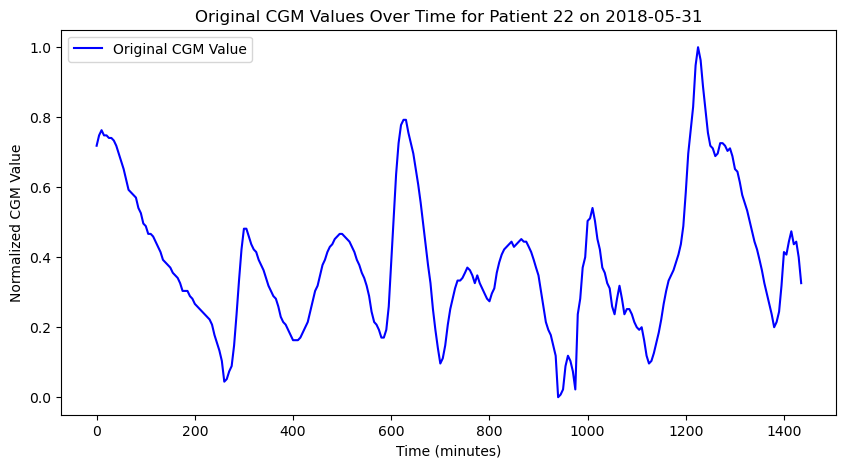

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Load and Preprocess Data from .txt file
data = pd.read_csv('/Users/liuyushen/Desktop/BG Prediction/Pump_CGMGlucoseValue.txt', delimiter='|', encoding='UTF-8')
df = pd.DataFrame(data)

# Filter for patient ID 22 and ensure datetime format
df = df[df['PtID'] == 22]
df = df[df['DataDtTm'].str.contains('2018-05-31')]
df['DataDtTm'] = pd.to_datetime(df['DataDtTm'])

# Sort by datetime to ensure chronological order
df = df.sort_values(by='DataDtTm').reset_index(drop=True)

# Convert datetime to a numerical format (time in minutes since the first timestamp)
df['Time'] = (df['DataDtTm'] - df['DataDtTm'].iloc[0]).dt.total_seconds() / 60.0

# Normalize CGM values for better scaling
df['CGMValue'] = (df['CGMValue'] - df['CGMValue'].min()) / (df['CGMValue'].max() - df['CGMValue'].min())

# Plot original CGM values and corresponding time
plt.figure(figsize=(10, 5))
plt.plot(df['Time'], df['CGMValue'], label='Original CGM Value', color='blue')

# Labels and title
plt.xlabel('Time (minutes)')
plt.ylabel('Normalized CGM Value')
plt.title('Original CGM Values Over Time for Patient 22 on 2018-05-31')
plt.legend()
plt.show()

## Step 2: Define the Neural ODE Model

In [56]:
class RNNEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim):
        super(RNNEncoder, self).__init__()
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim

        self.rnn = nn.GRU(input_dim+1, hidden_dim)
        self.hid2lat = nn.Linear(hidden_dim, 2*latent_dim)

    def forward(self, x, t):
        # Concatenate time to input
        t = t.clone()
        t[1:] = t[:-1] - t[1:]
        t[0] = 0.
        xt = torch.cat((x, t), dim=-1)

        _, h0 = self.rnn(xt.flip((0,)))  # Reversed
        # Compute latent dimension
        z0 = self.hid2lat(h0[0])

        z0_mean = z0[:, :self.latent_dim]
        z0_log_var = z0[:, self.latent_dim:]
        # z0_mean = z0[:self.latent_dim]
        # z0_log_var = z0[self.latent_dim:]

        return z0_mean, z0_log_var

In [29]:
class NeuralODEDecoder(nn.Module):
    def __init__(self, output_dim, hidden_dim, latent_dim):
        super(NeuralODEDecoder, self).__init__()
        self.output_dim = output_dim
        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim

        func = NNODEF(latent_dim, hidden_dim, time_invariant=True)
        self.ode = NeuralODE(func)
        self.l2h = nn.Linear(latent_dim, hidden_dim)
        self.h2o = nn.Linear(hidden_dim, output_dim)

    def forward(self, z0, t):
        zs = self.ode(z0, t, return_whole_sequence=True)

        hs = self.l2h(zs)
        xs = self.h2o(hs)
        return xs

In [30]:
class ODEVAE(nn.Module):
    def __init__(self, output_dim, hidden_dim, latent_dim):
        super(ODEVAE, self).__init__()
        self.output_dim = output_dim
        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim

        self.encoder = RNNEncoder(output_dim, hidden_dim, latent_dim)
        self.decoder = NeuralODEDecoder(output_dim, hidden_dim, latent_dim)

    def forward(self, x, t, MAP=False):
        z_mean, z_log_var = self.encoder(x, t)
        if MAP:
            z = z_mean
        else:
            z = z_mean + torch.randn_like(z_mean) * torch.exp(0.5 * z_log_var)
        x_p = self.decoder(z, t)
        return x_p, z, z_mean, z_log_var

    def generate_with_seed(self, seed_x, t):
        seed_t_len = seed_x.shape[0]
        z_mean, z_log_var = self.encoder(seed_x, t[:seed_t_len])
        x_p = self.decoder(z_mean, t)
        return x_p

In [31]:
def gen_batch(cgm_tensor, time_tensor, batch_size, n_sample=30):
    time_len = cgm_tensor.shape[0]  # Total number of time steps

    # Generate as many full batches as possible with the given `batch_size` and `n_sample`
    for i in range(0, time_len - n_sample + 1, n_sample):
        # Slice the data for a batch of sequences
        x_batch = []
        t_batch = []
        for j in range(batch_size):
            # Make sure the indices stay within bounds
            if i + n_sample <= time_len:
                x_batch.append(cgm_tensor[i:i + n_sample].reshape(n_sample, -1))
                t_batch.append(time_tensor[i:i + n_sample].reshape(n_sample, -1))
        
        # Only yield if we have enough sequences for a full batch
        if len(x_batch) == batch_size:
            x_batch = torch.stack(x_batch)  # Shape: [batch_size, n_sample, 1]
            t_batch = torch.stack(t_batch)  # Shape: [batch_size, n_sample, 1]
            yield x_batch, t_batch


## Step 3: Train the Neural ODE Model

In [75]:
vae = ODEVAE(2, 64, 6)

In [76]:
optim = torch.optim.Adam(vae.parameters(), betas=(0.9, 0.999), lr=0.001)

Epoch 0, Loss: 0.27846476435661316


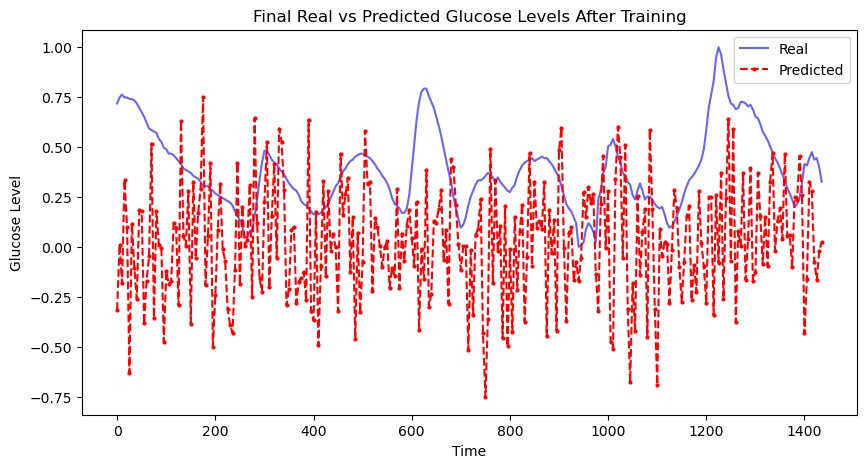

Epoch 100, Loss: 0.021598802879452705


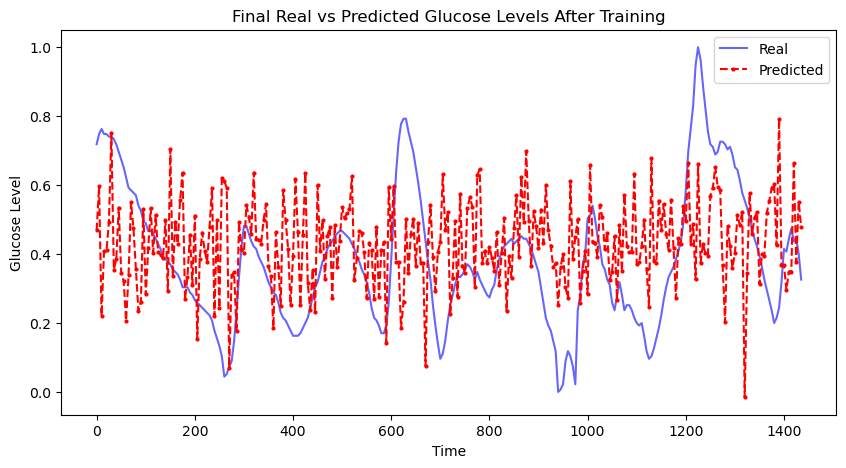

Epoch 200, Loss: 0.02467562071979046


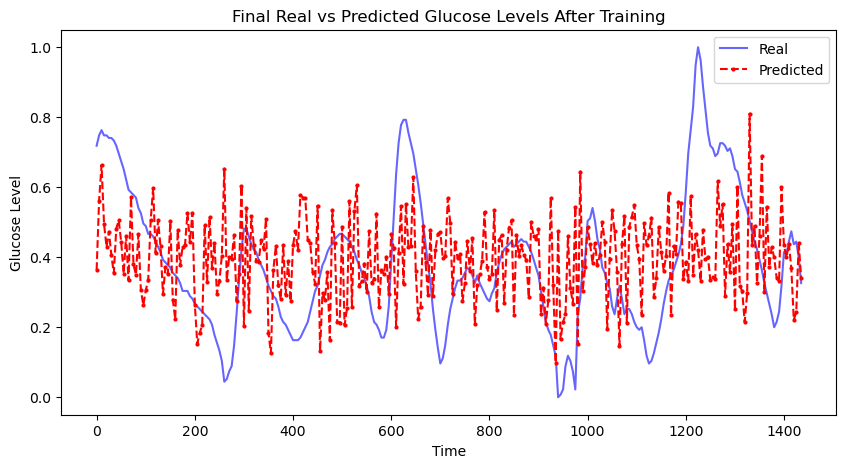

Epoch 300, Loss: 0.02103060483932495


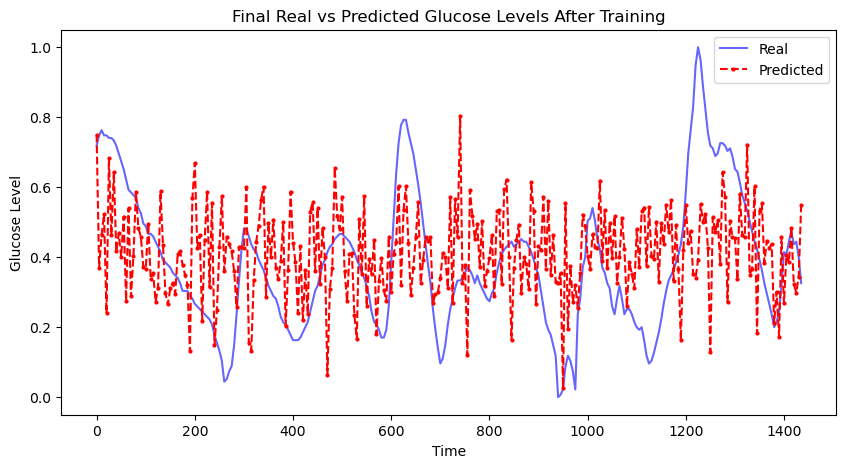

Epoch 400, Loss: 0.022237055003643036


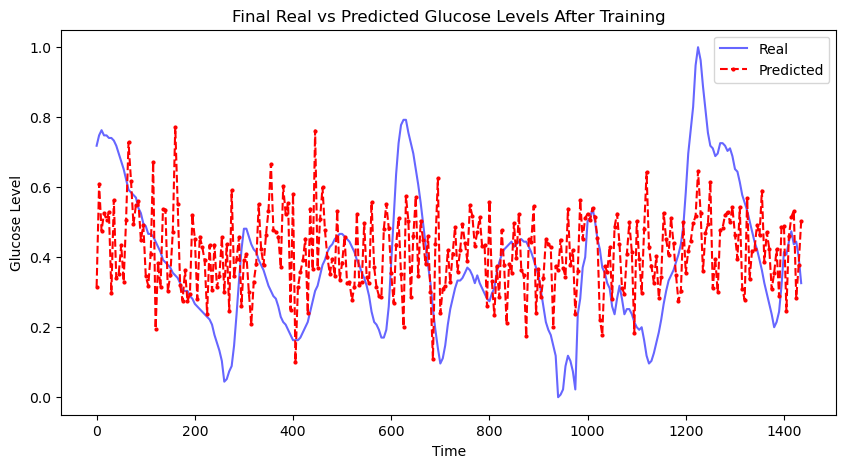

Epoch 500, Loss: 0.02463383786380291


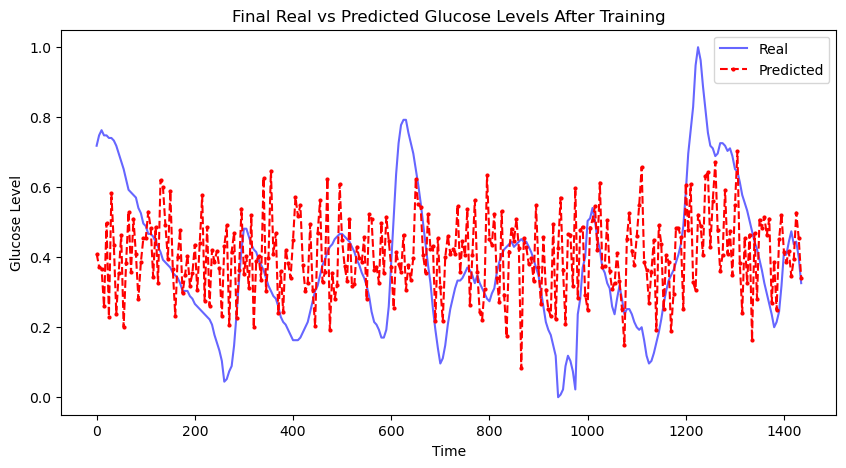

Epoch 600, Loss: 0.020466051995754242


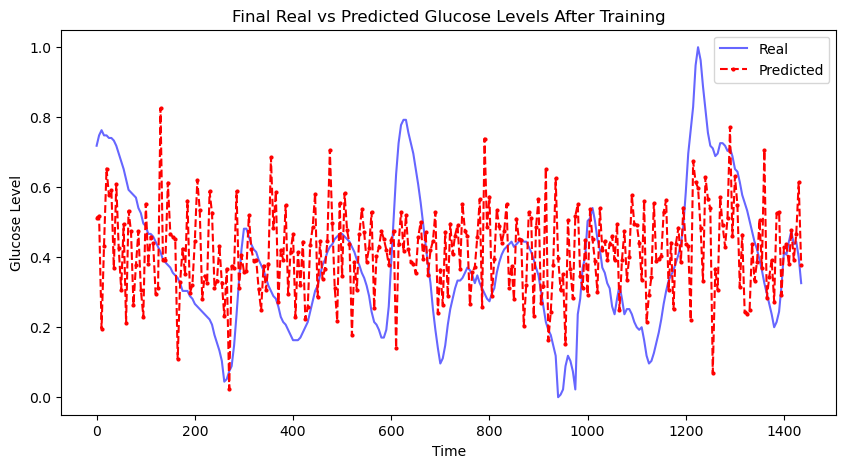

Epoch 700, Loss: 0.019535118713974953


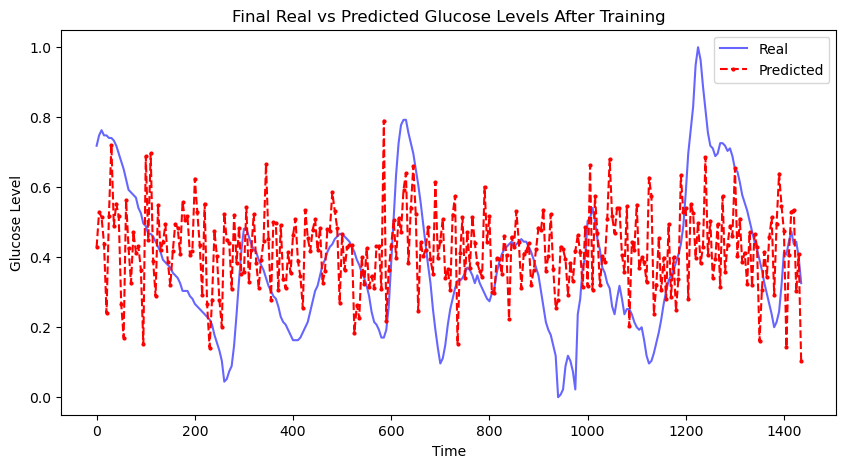

Epoch 800, Loss: 0.02055763080716133


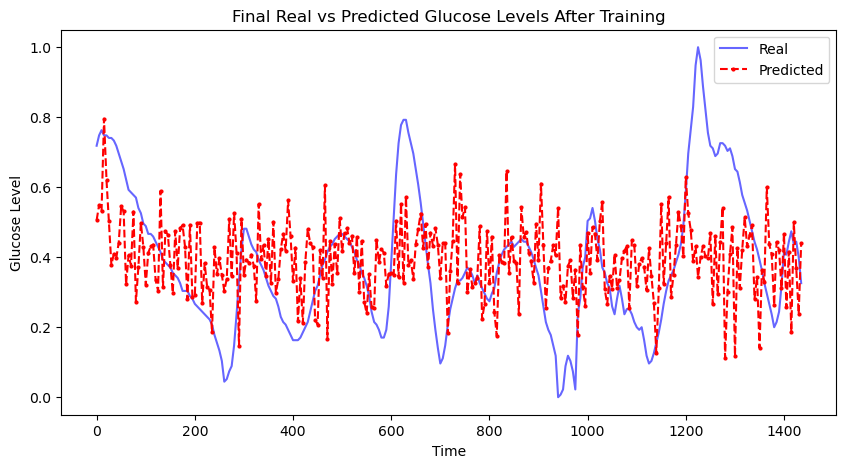

Epoch 900, Loss: 0.020262189209461212


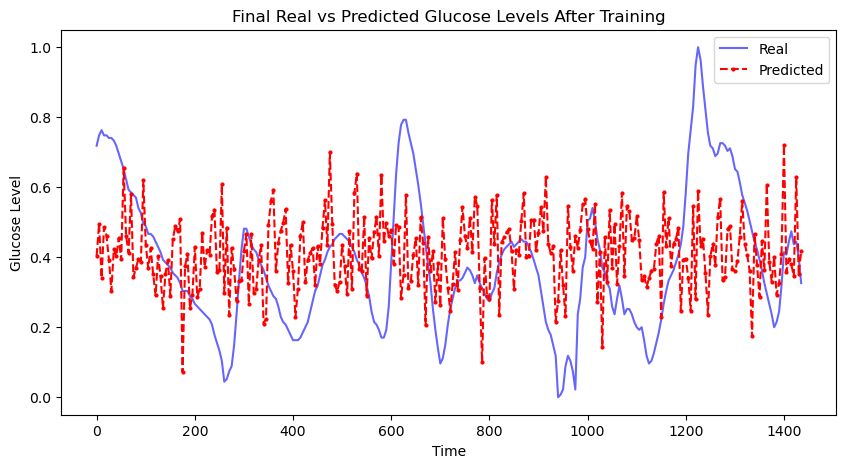

Epoch 1000, Loss: 0.023570487275719643


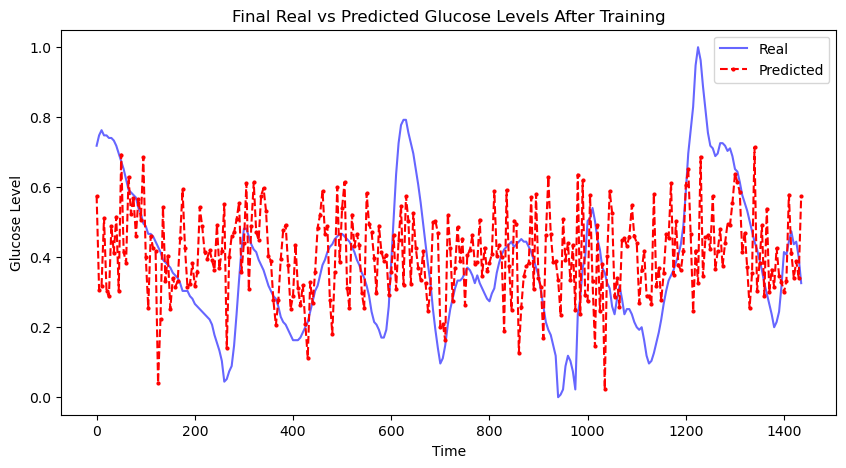

Epoch 1100, Loss: 0.026449359953403473


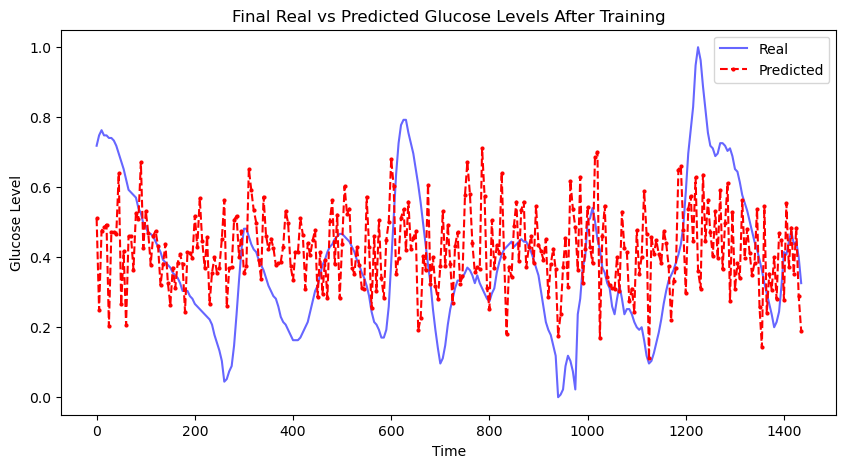

Epoch 1200, Loss: 0.01953749731183052


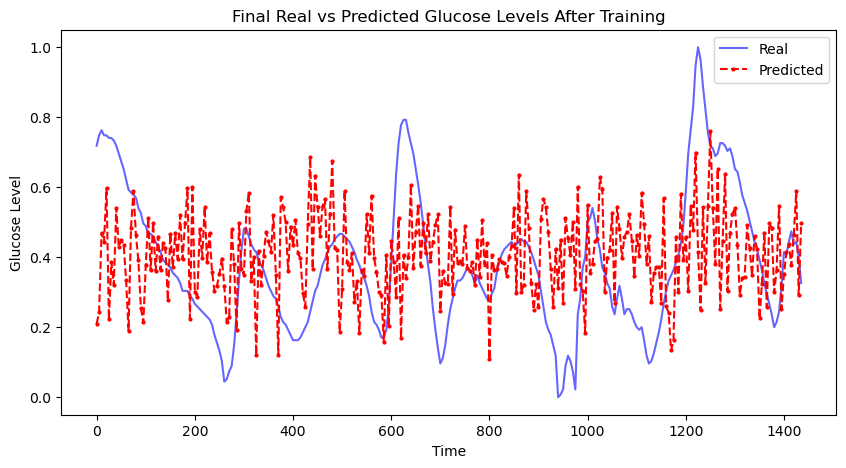

Epoch 1300, Loss: 0.024733375757932663


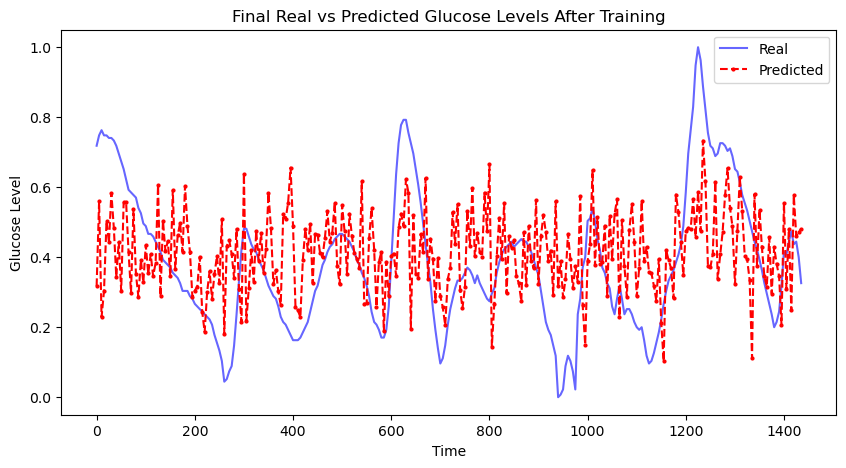

Epoch 1400, Loss: 0.020985104143619537


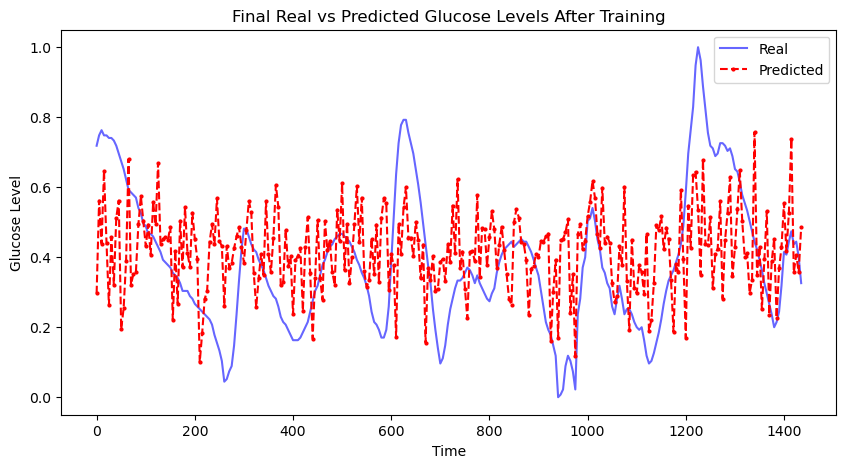

Epoch 1500, Loss: 0.023495718836784363


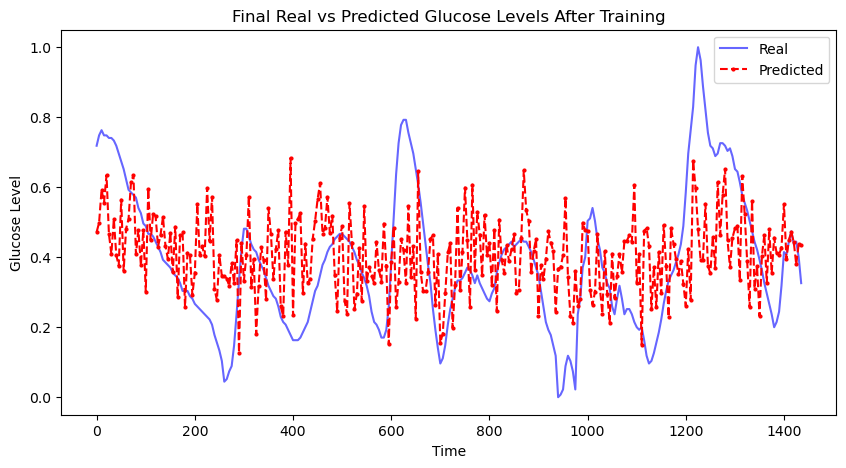

Epoch 1600, Loss: 0.021355144679546356


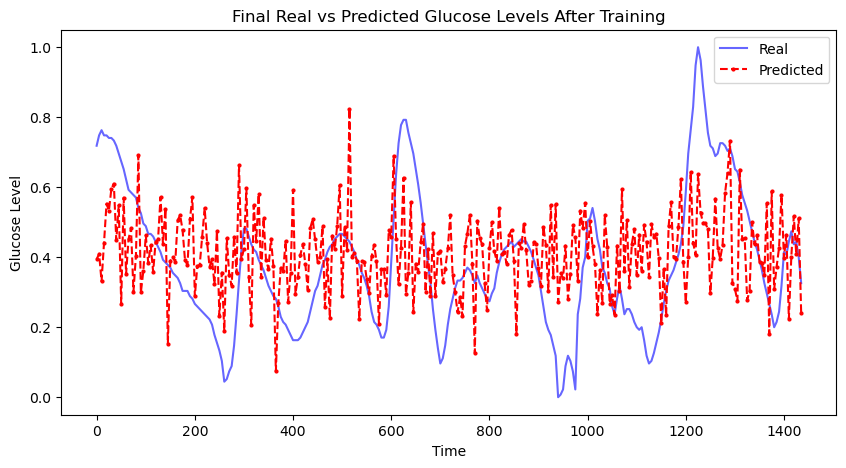

Epoch 1700, Loss: 0.019108565524220467


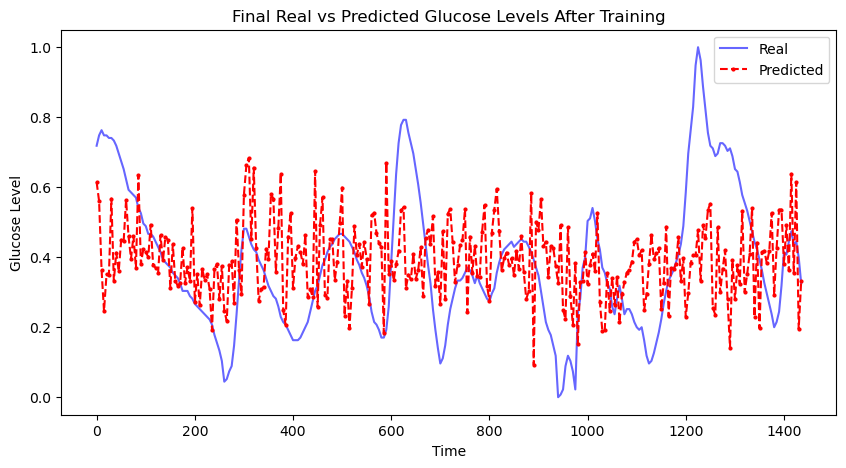

Epoch 1800, Loss: 0.020151885226368904


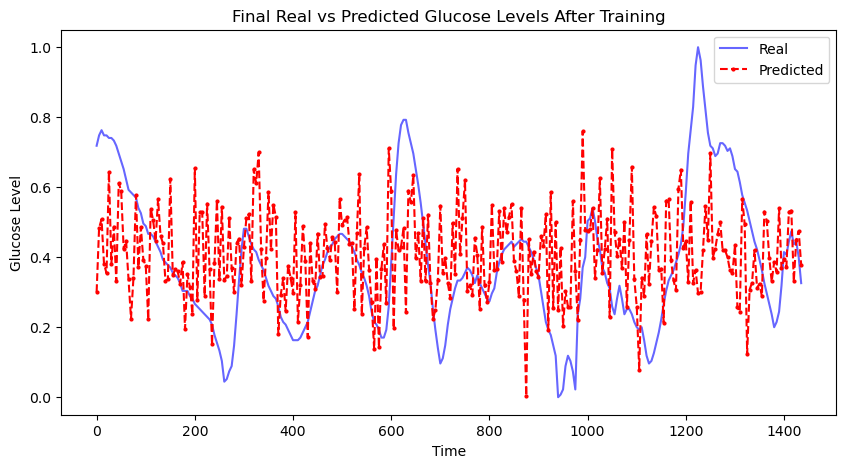

Epoch 1900, Loss: 0.022816376760601997


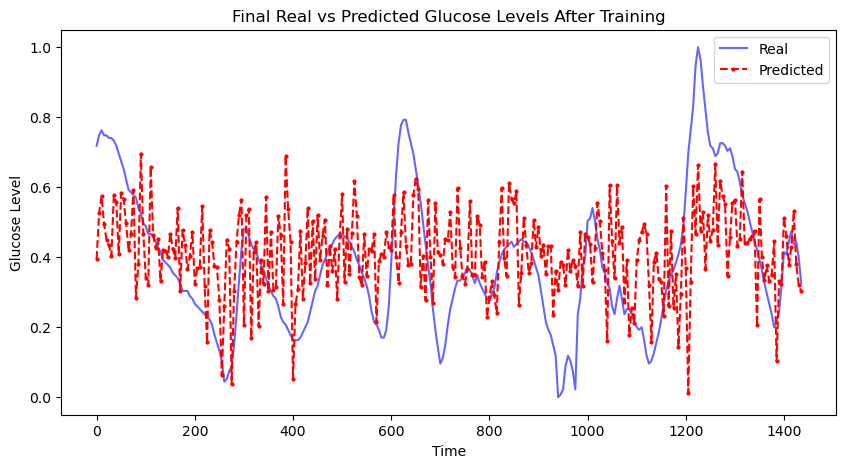

Epoch 2000, Loss: 0.019558589905500412


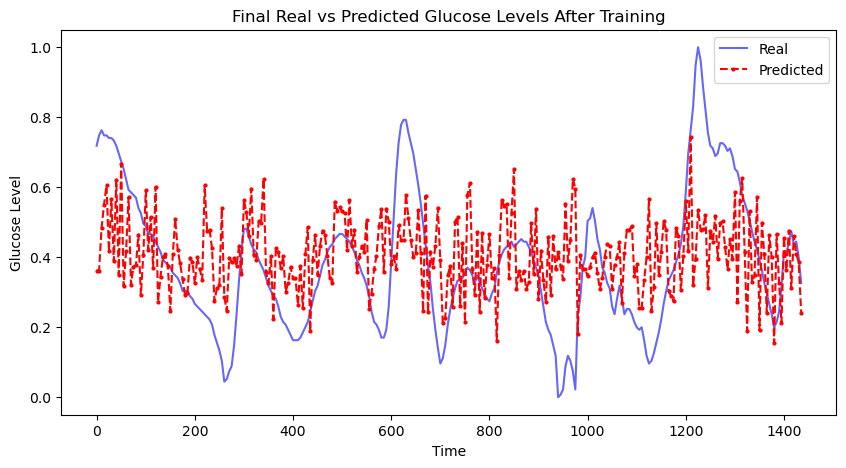

Epoch 2100, Loss: 0.01985061541199684


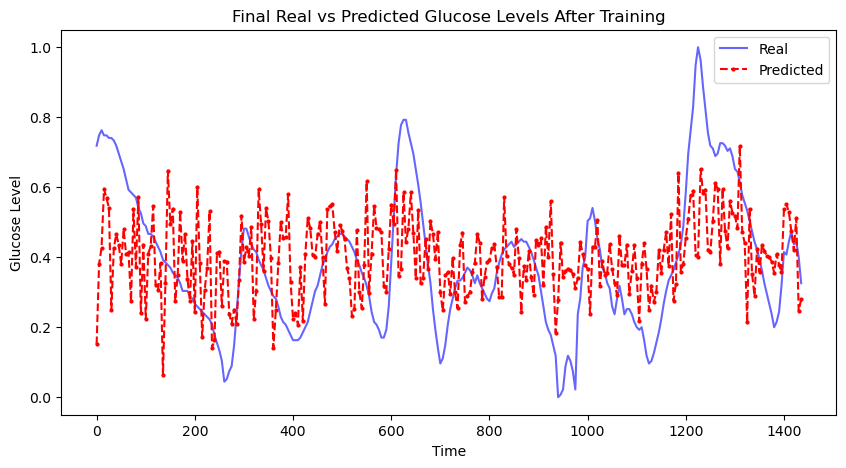

Epoch 2200, Loss: 0.01896721124649048


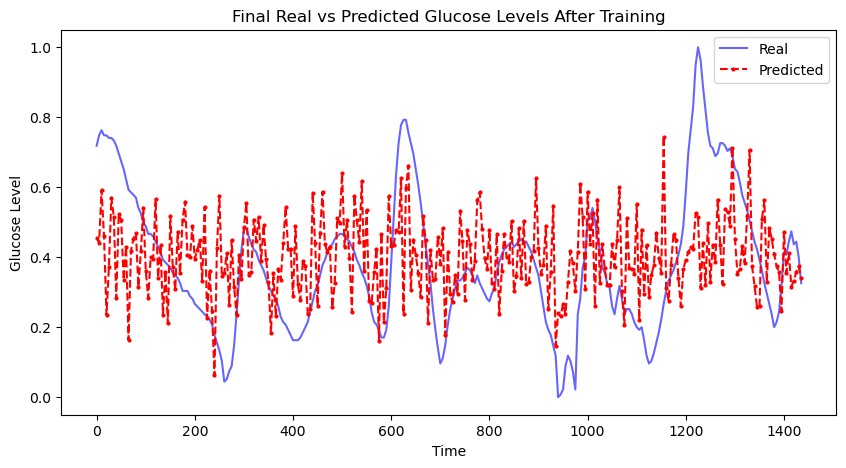

Epoch 2300, Loss: 0.020314812660217285


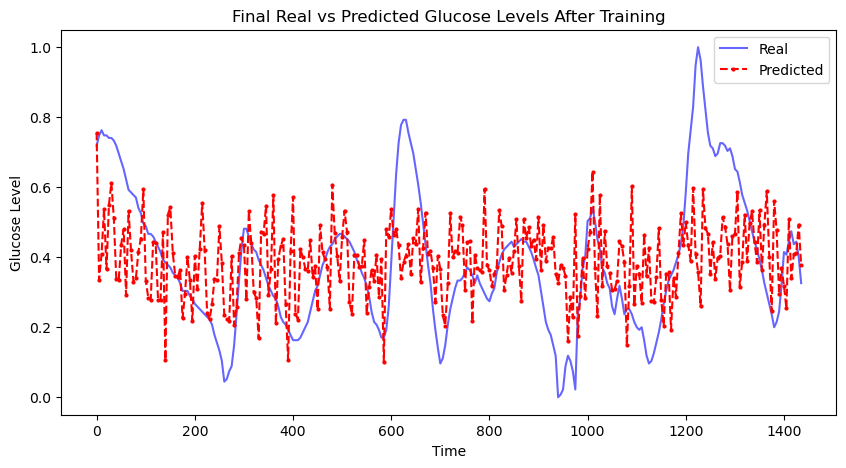

Epoch 2400, Loss: 0.024632461369037628


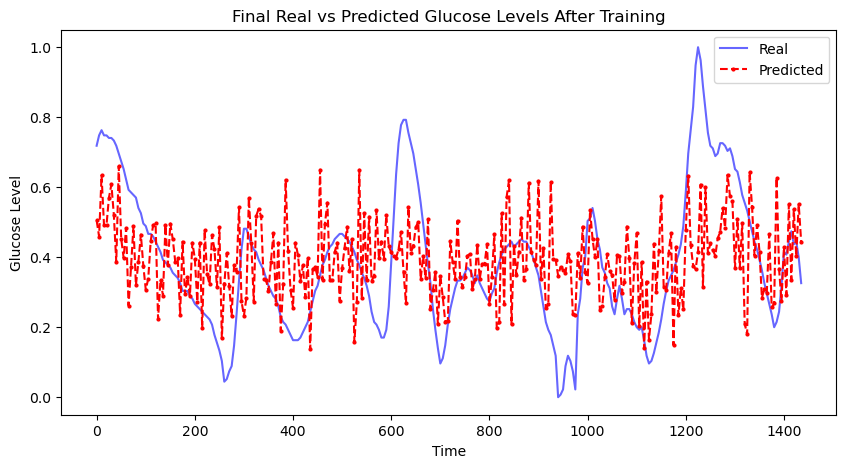

Epoch 2500, Loss: 0.02053084224462509


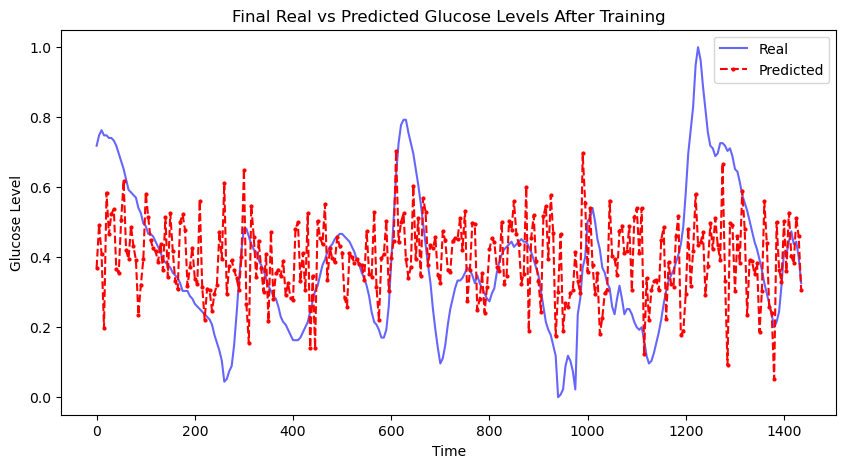

Epoch 2600, Loss: 0.024074606597423553


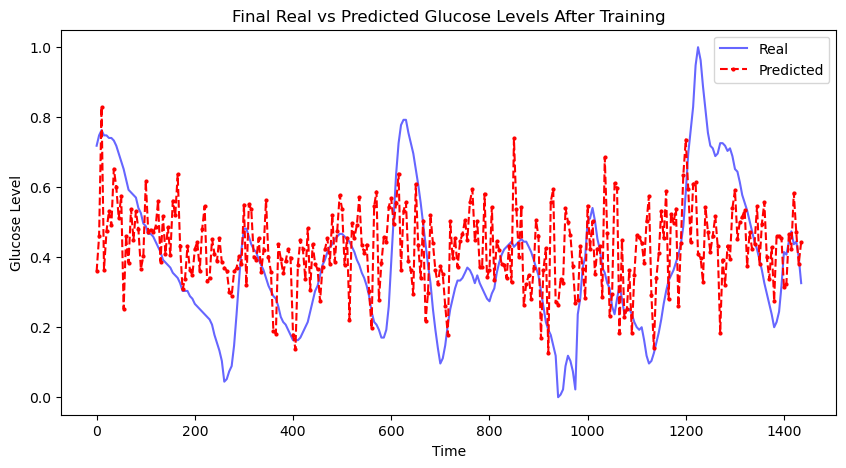

Epoch 2700, Loss: 0.01856152154505253


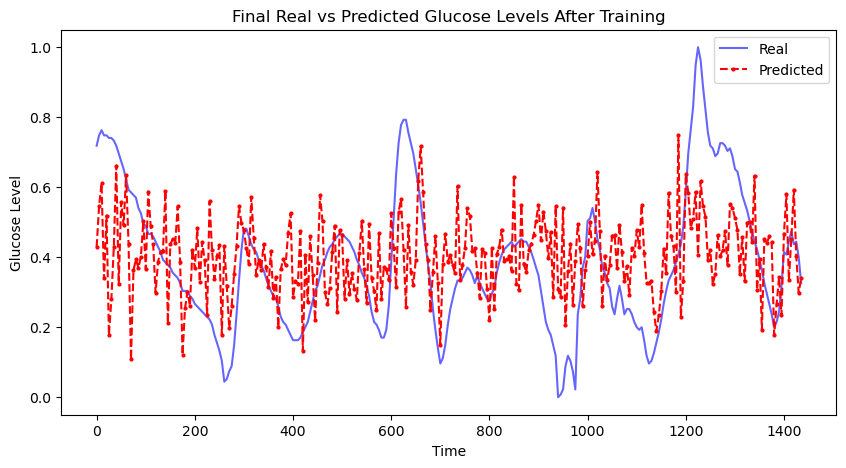

Epoch 2800, Loss: 0.02250675857067108


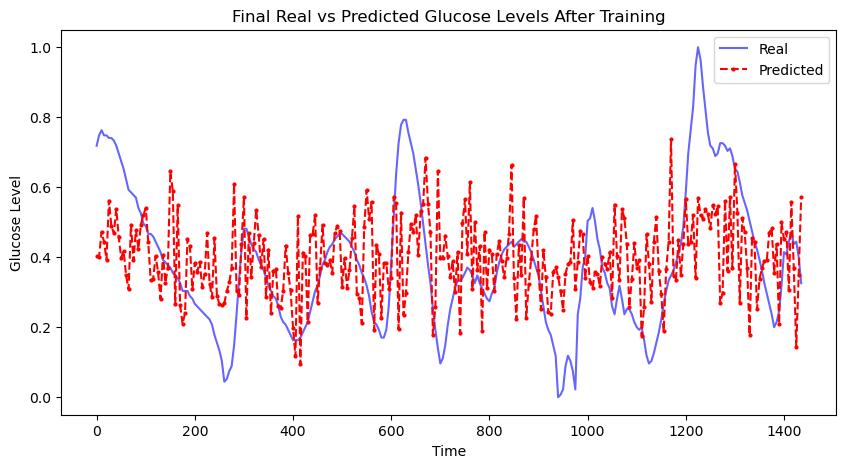

Epoch 2900, Loss: 0.020108357071876526


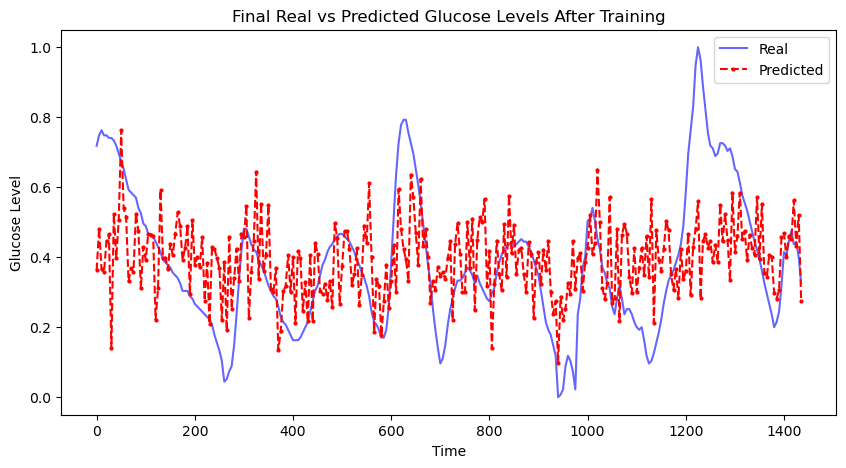

Epoch 3000, Loss: 0.021360743790864944


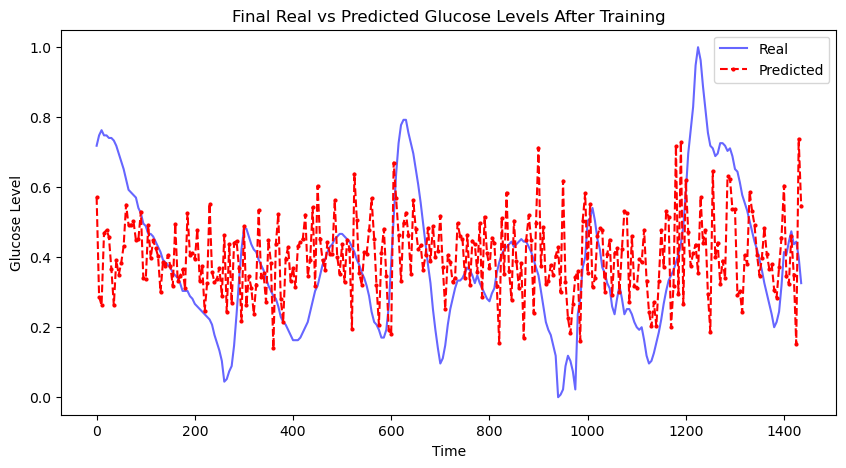

Epoch 3100, Loss: 0.020313074812293053


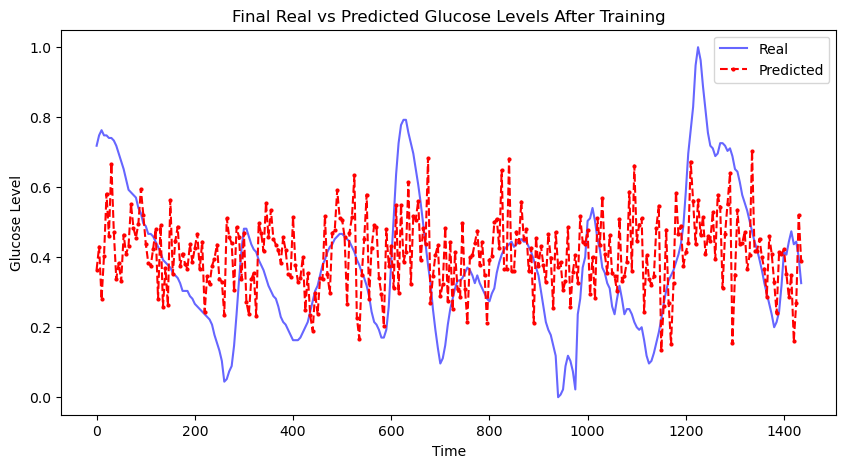

Epoch 3200, Loss: 0.02384190633893013


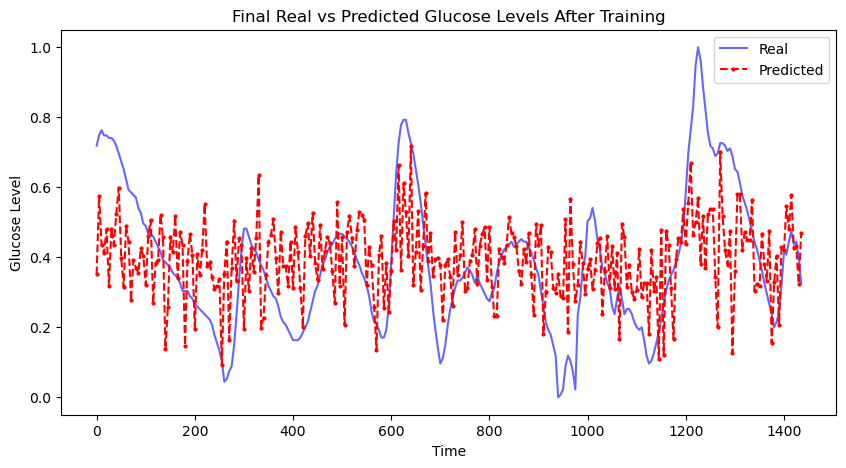

Epoch 3300, Loss: 0.02271924540400505


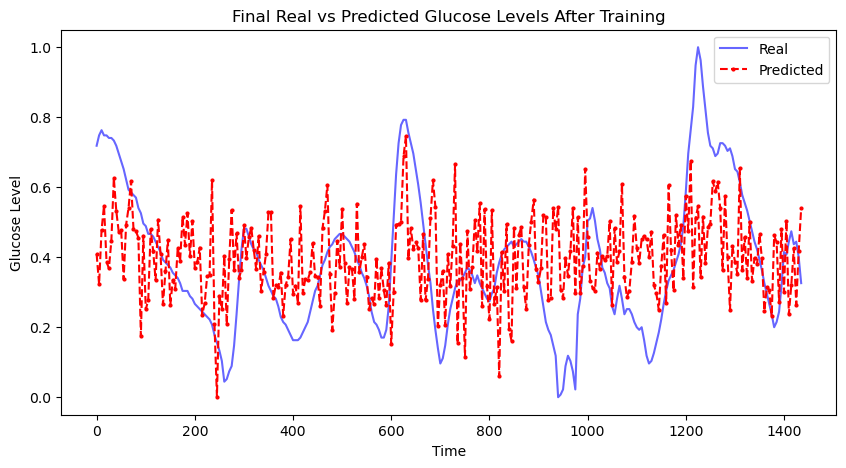

Epoch 3400, Loss: 0.01977442018687725


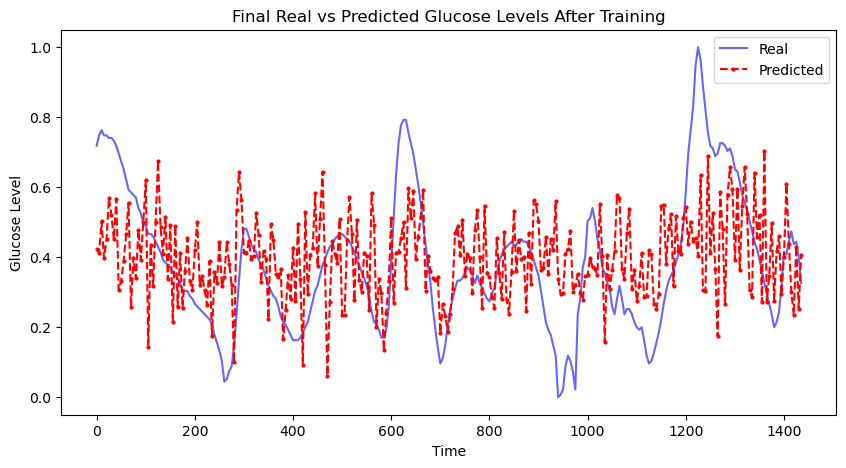

Epoch 3500, Loss: 0.025385411456227303


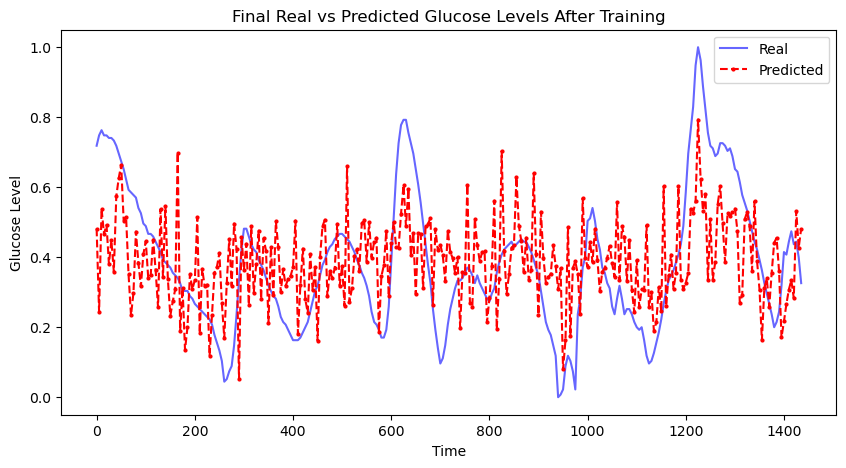

Epoch 3600, Loss: 0.020447062328457832


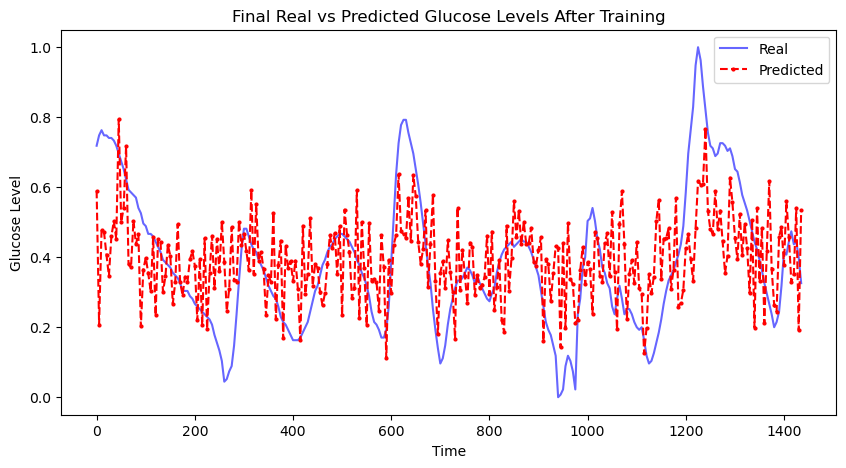

Epoch 3700, Loss: 0.020421430468559265


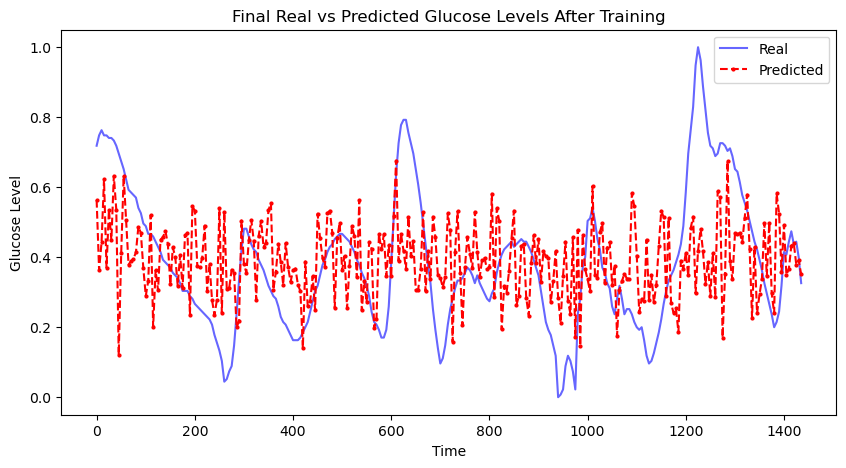

Epoch 3800, Loss: 0.021590813994407654


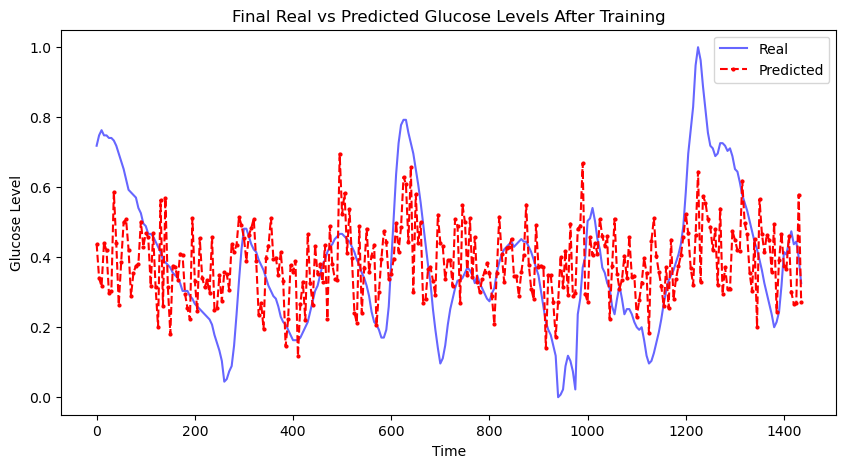

Epoch 3900, Loss: 0.026384767144918442


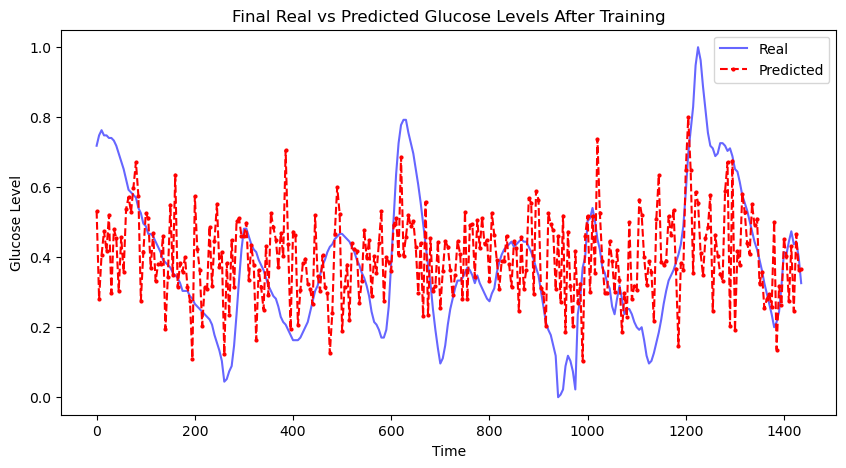

Epoch 4000, Loss: 0.023054759949445724


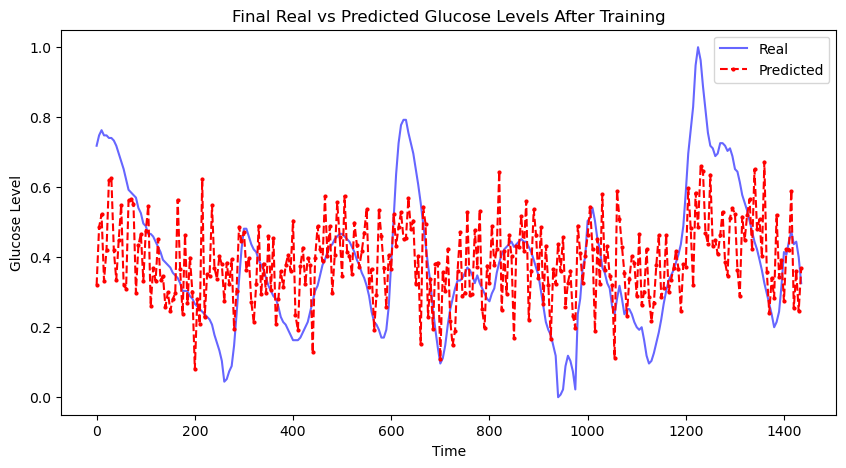

Epoch 4100, Loss: 0.02065143547952175


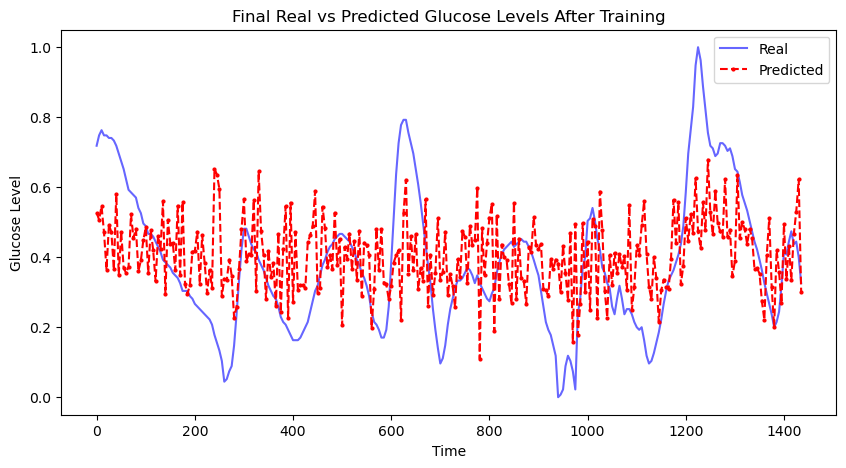

Epoch 4200, Loss: 0.023415563628077507


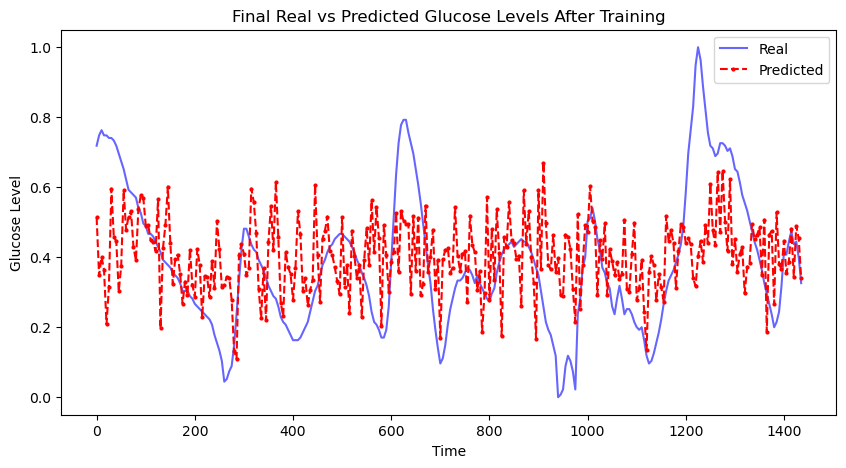

Epoch 4300, Loss: 0.021522115916013718


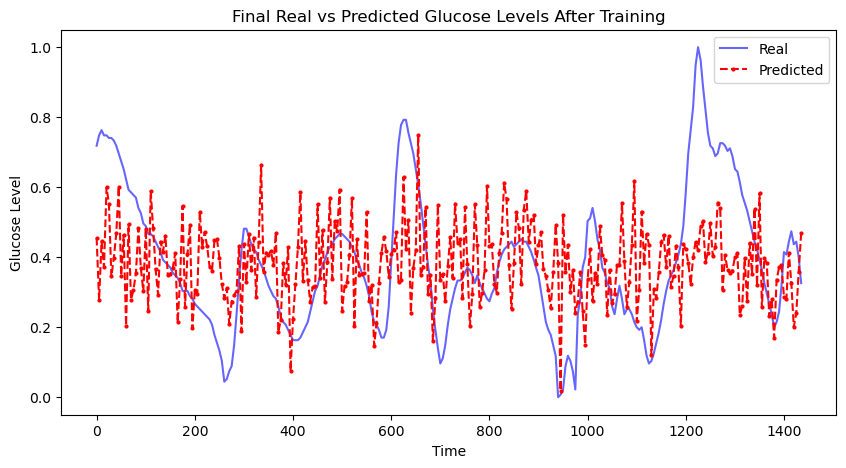

Epoch 4400, Loss: 0.018957749009132385


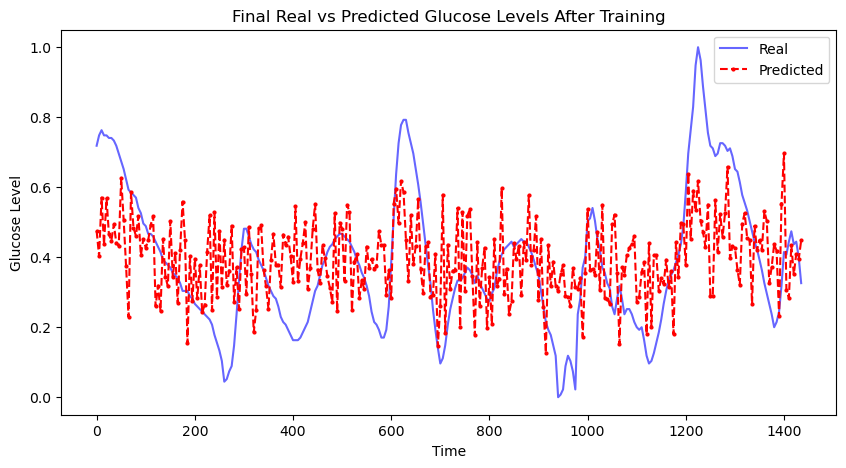

Epoch 4500, Loss: 0.024028325453400612


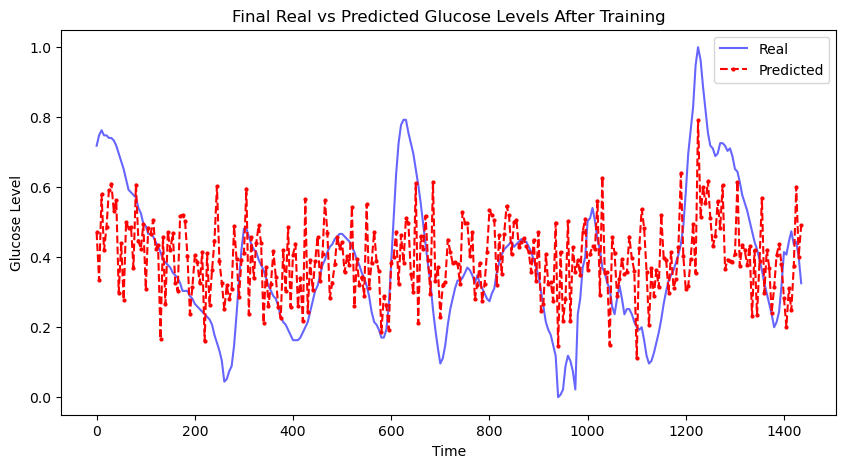

Epoch 4600, Loss: 0.0230106208473444


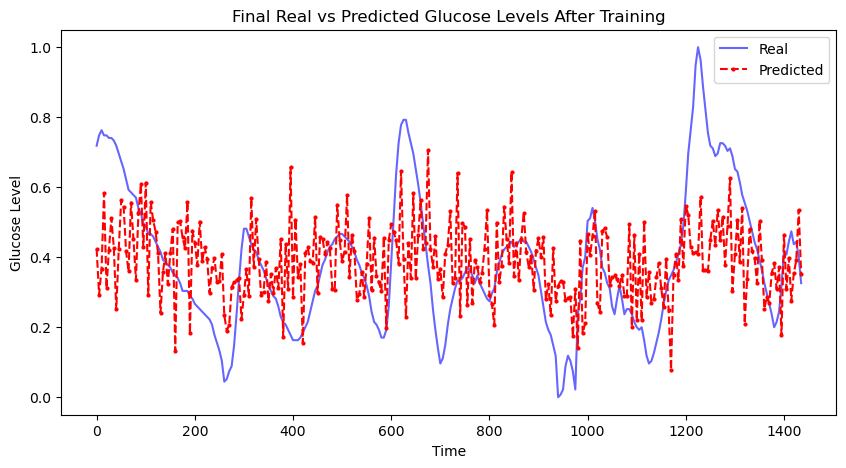

Epoch 4700, Loss: 0.02207457646727562


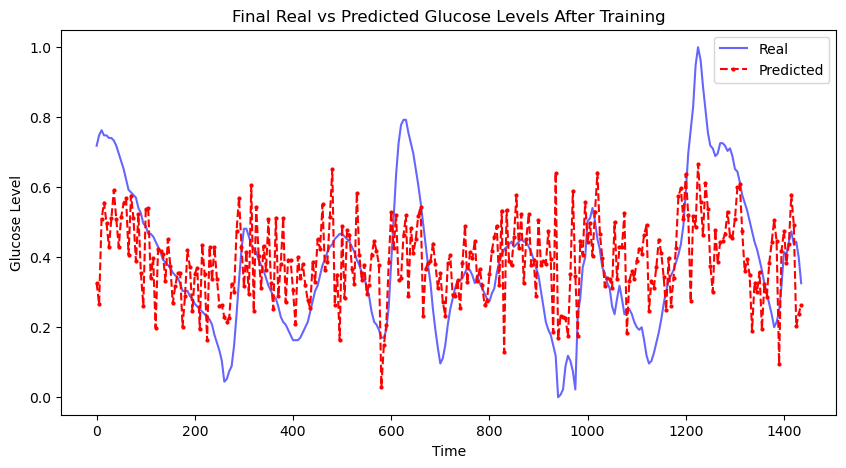

Epoch 4800, Loss: 0.023898903280496597


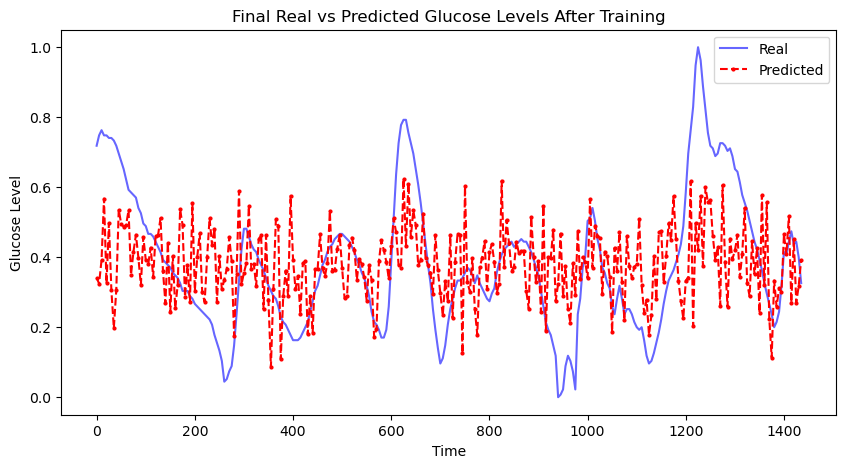

Epoch 4900, Loss: 0.021582528948783875


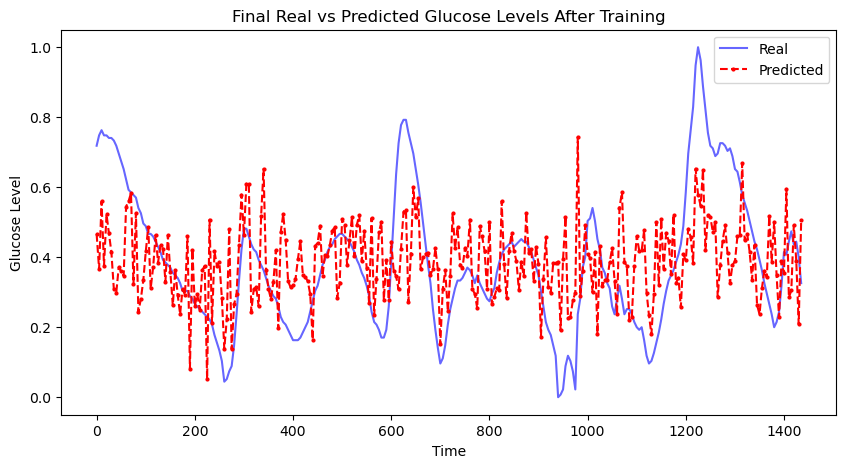

Epoch 5000, Loss: 0.024408910423517227


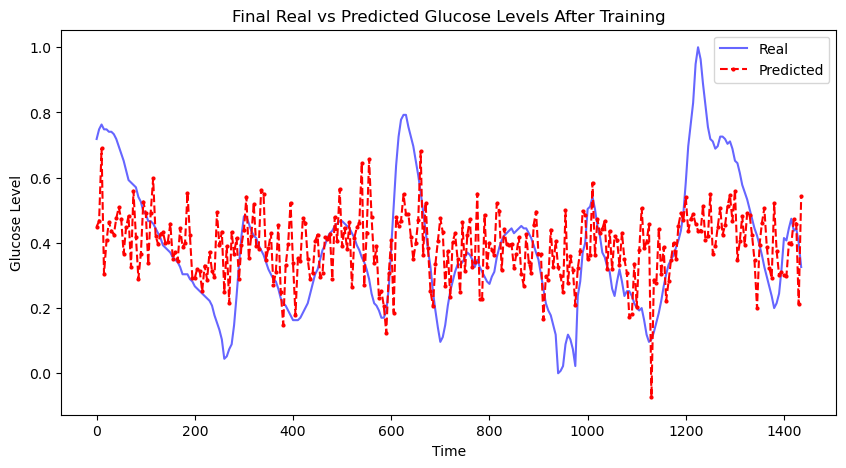

Epoch 5100, Loss: 0.022953618317842484


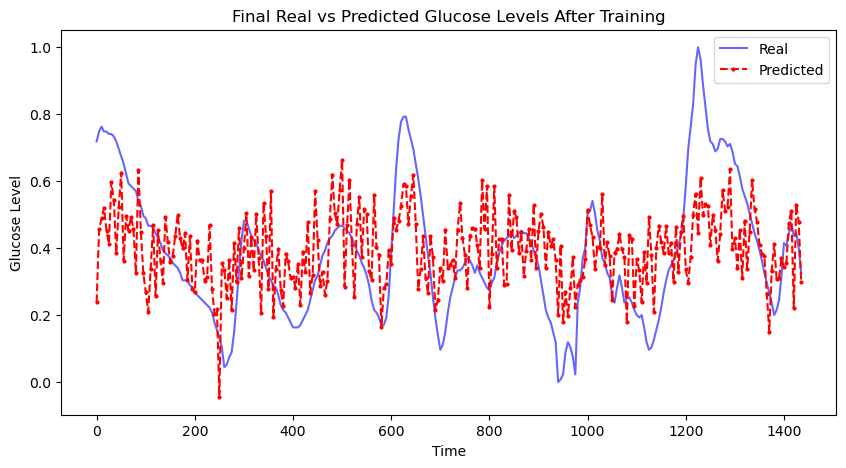

Epoch 5200, Loss: 0.02153642848134041


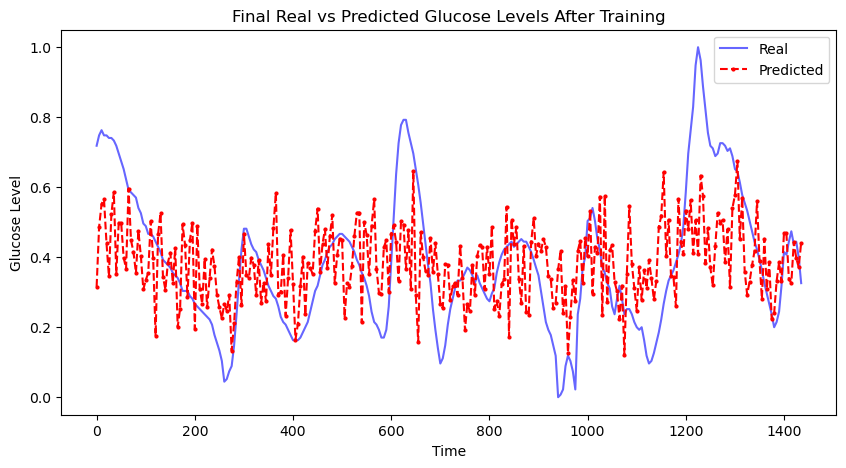

Epoch 5300, Loss: 0.018273182213306427


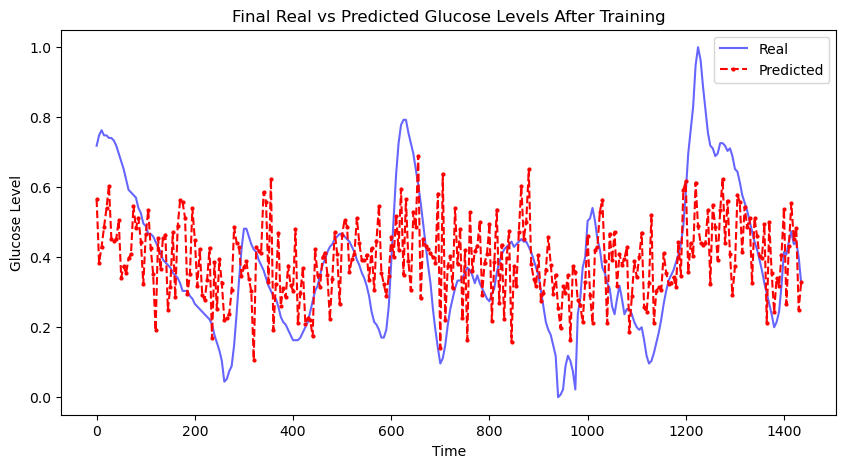

Epoch 5400, Loss: 0.021607914939522743


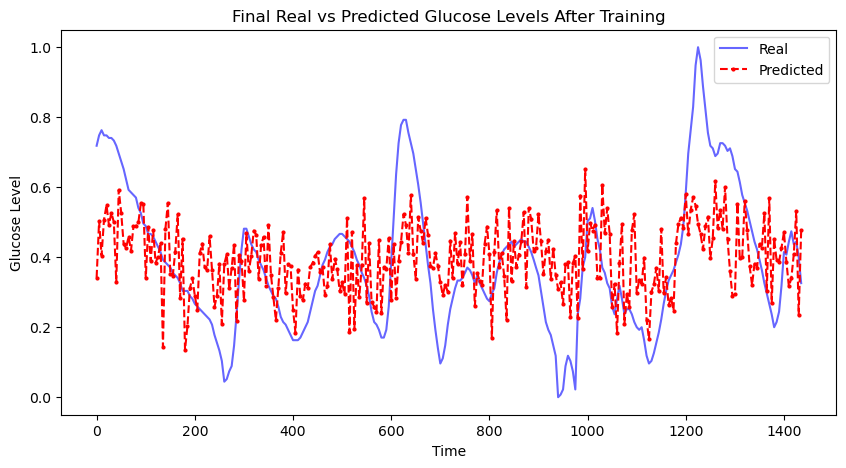

Epoch 5500, Loss: 0.020832069218158722


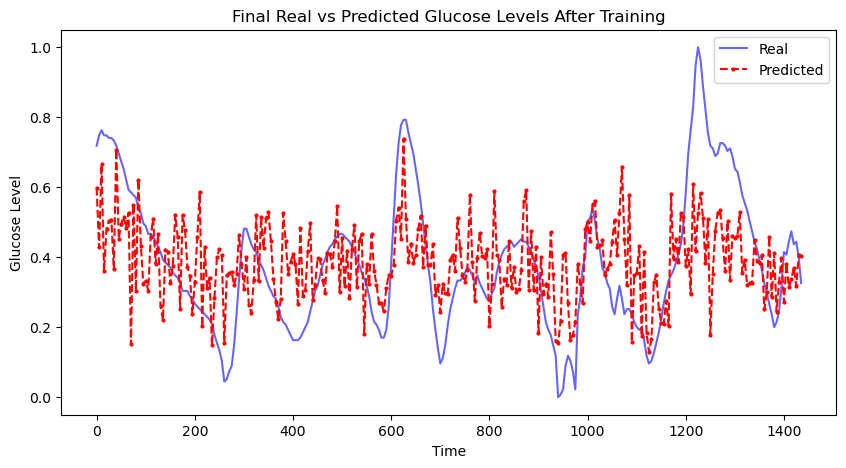

Epoch 5600, Loss: 0.02104666270315647


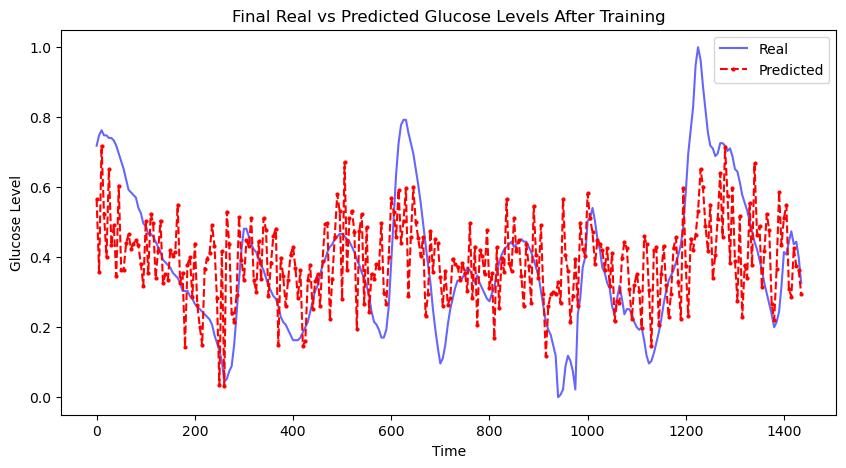

Epoch 5700, Loss: 0.019525296986103058


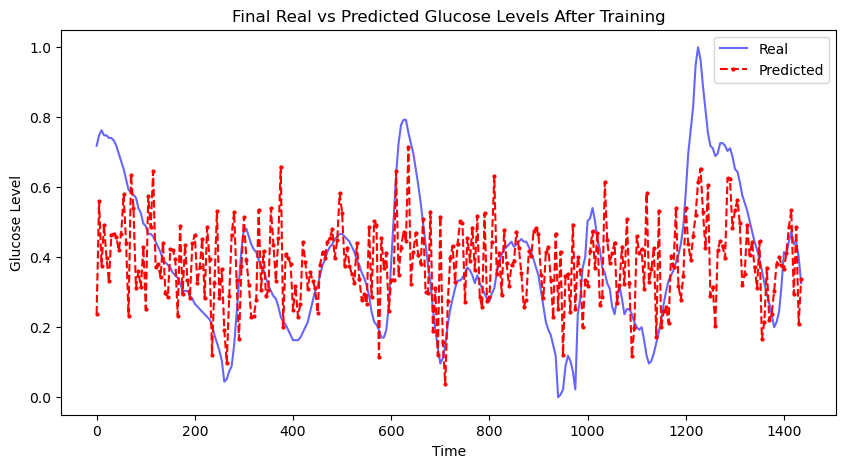

Epoch 5800, Loss: 0.01889815181493759


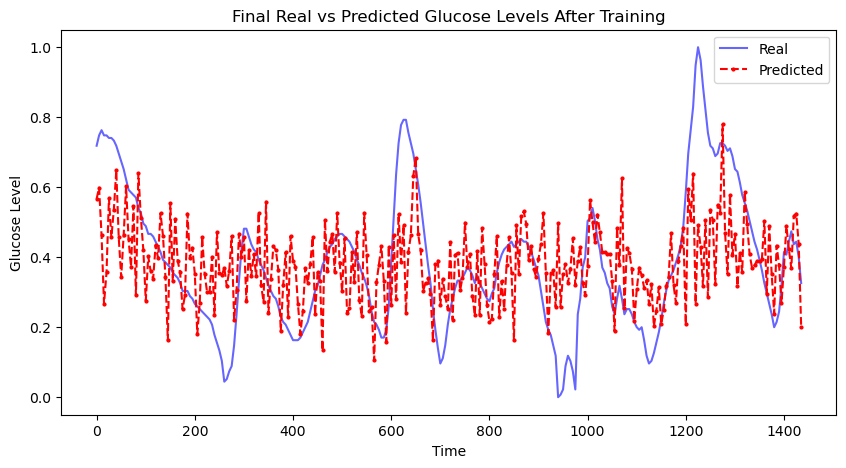

Epoch 5900, Loss: 0.02187134325504303


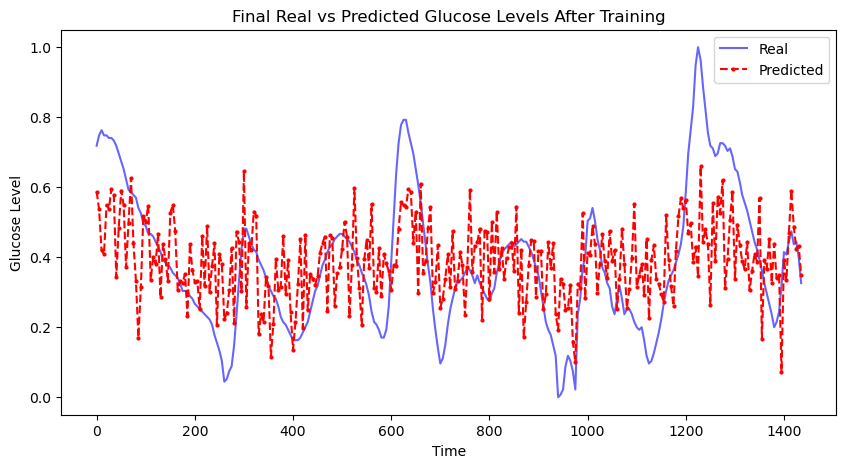

Epoch 6000, Loss: 0.021860552951693535


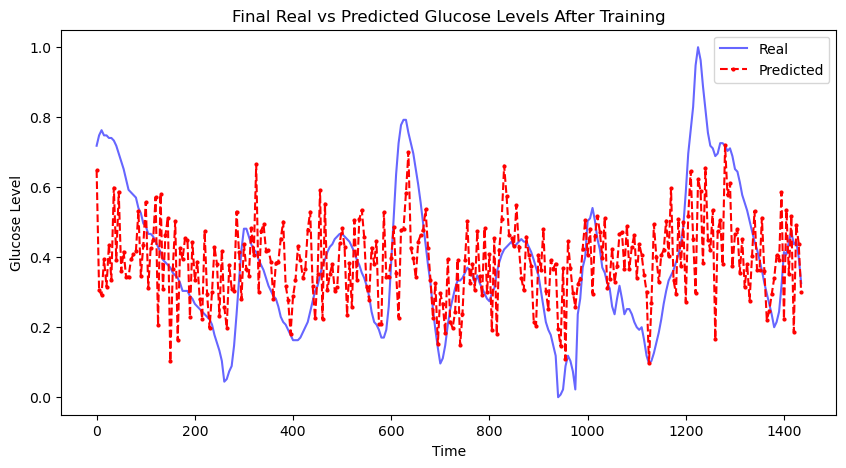

Epoch 6100, Loss: 0.020625857636332512


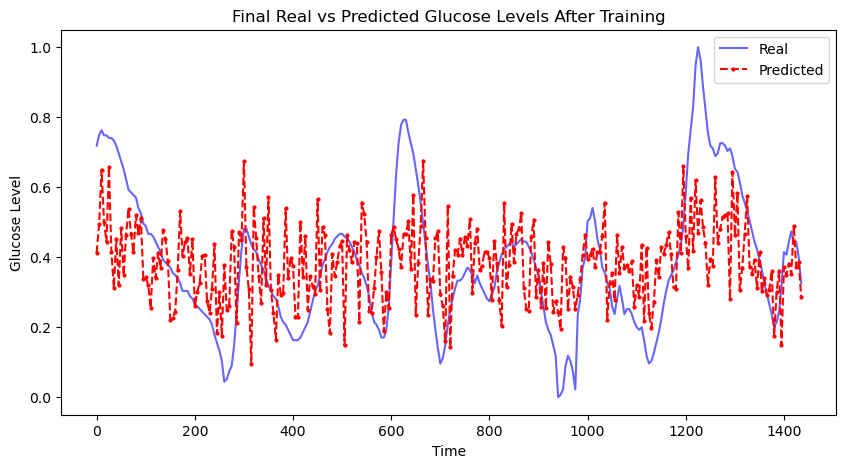

Epoch 6200, Loss: 0.021595997735857964


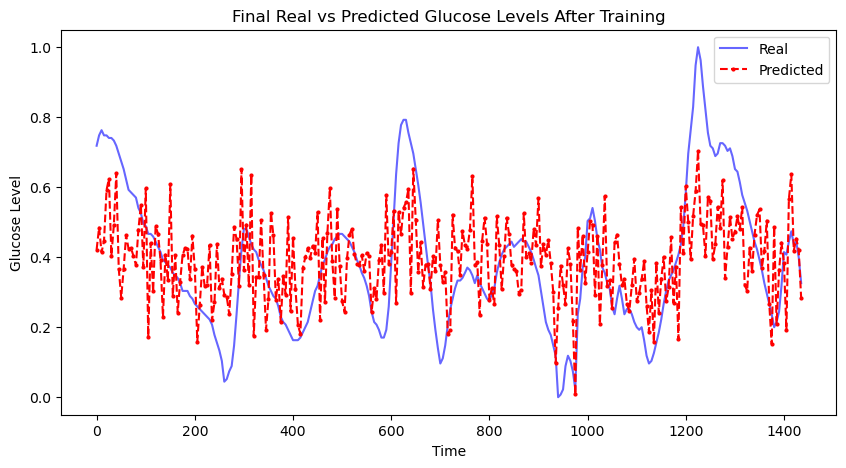

Epoch 6300, Loss: 0.022103317081928253


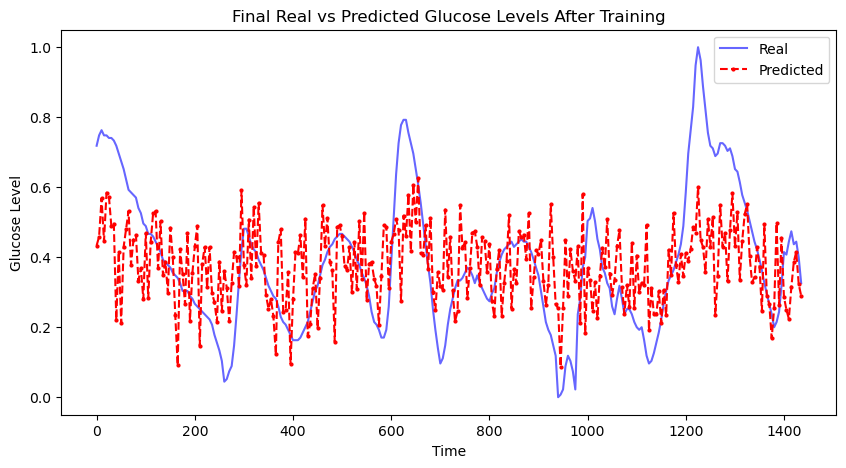

Epoch 6400, Loss: 0.020129580050706863


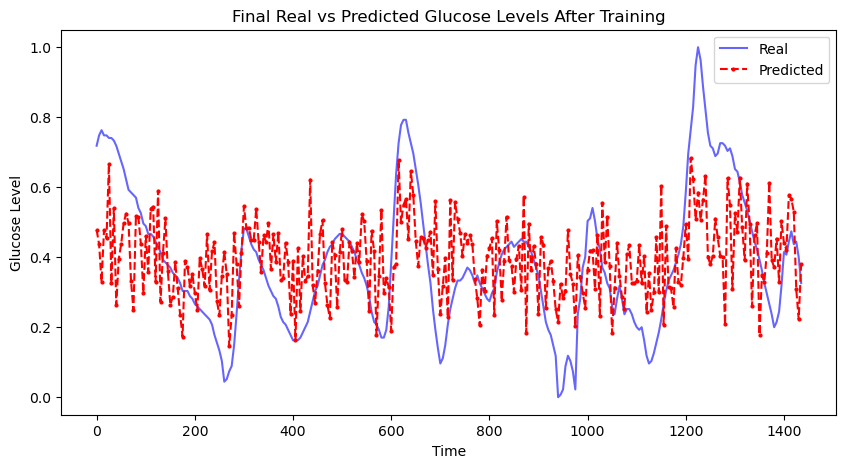

Epoch 6500, Loss: 0.023491330444812775


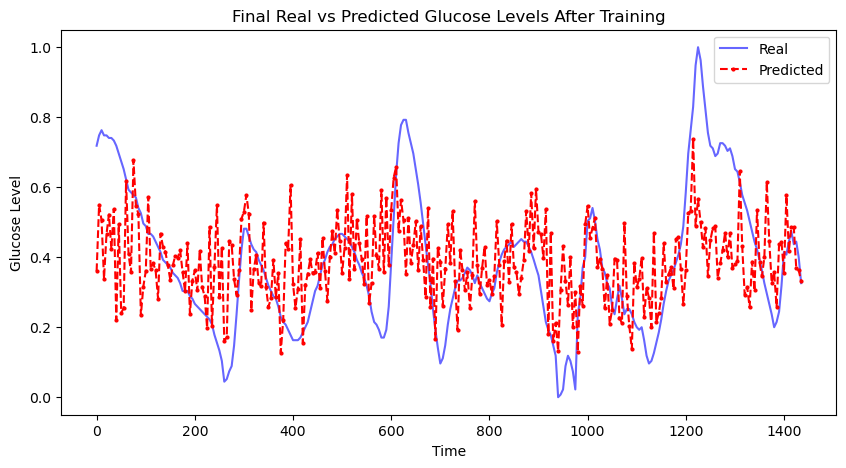

Epoch 6600, Loss: 0.02175147831439972


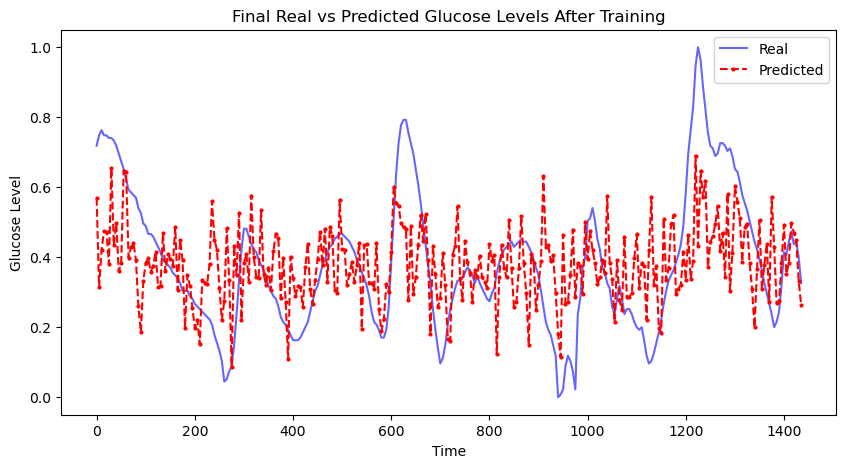

Epoch 6700, Loss: 0.020987506955862045


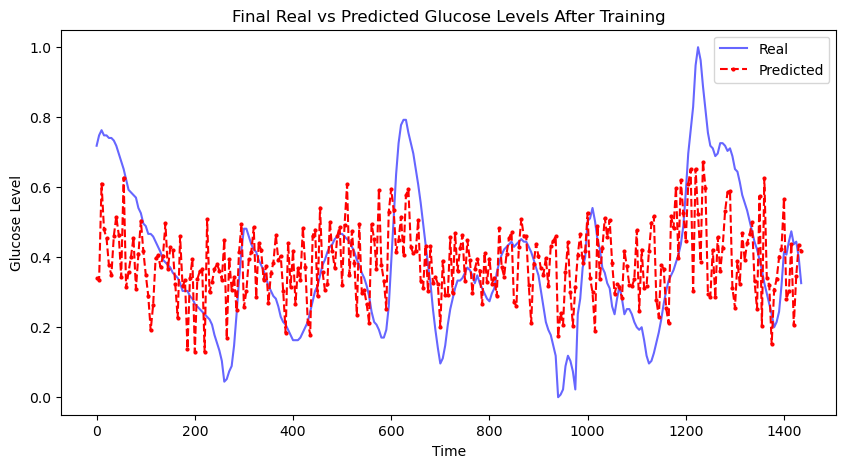

Epoch 6800, Loss: 0.02304178848862648


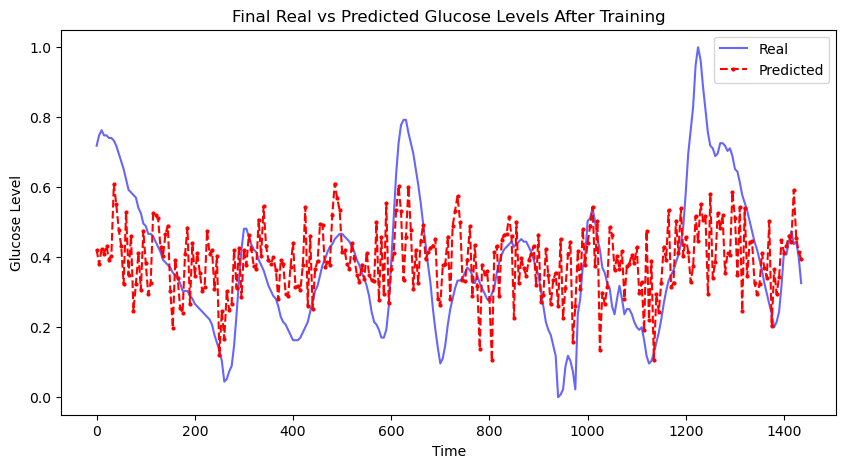

Epoch 6900, Loss: 0.02587878704071045


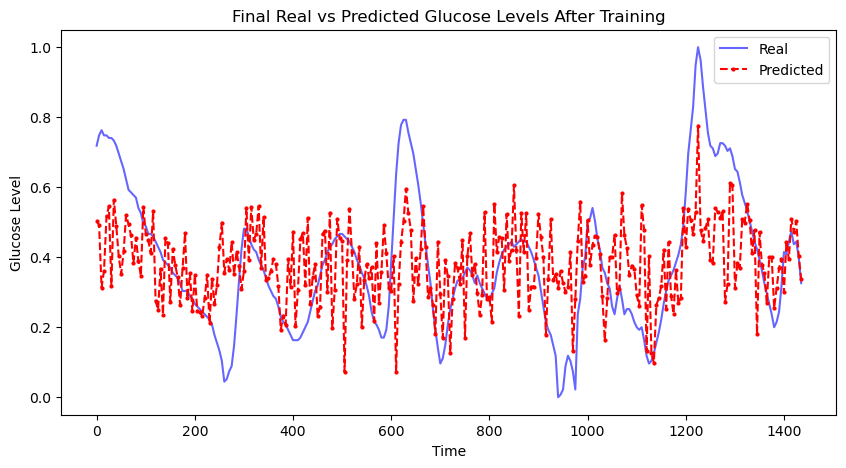

Epoch 7000, Loss: 0.020641539245843887


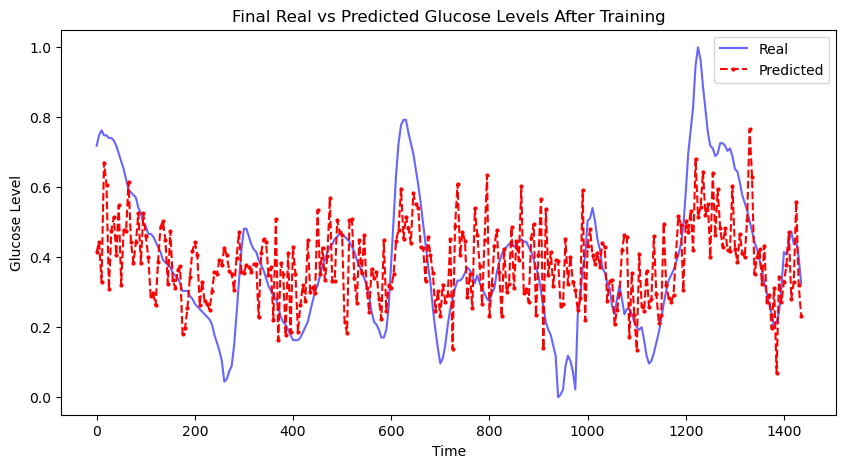

Epoch 7100, Loss: 0.02197263203561306


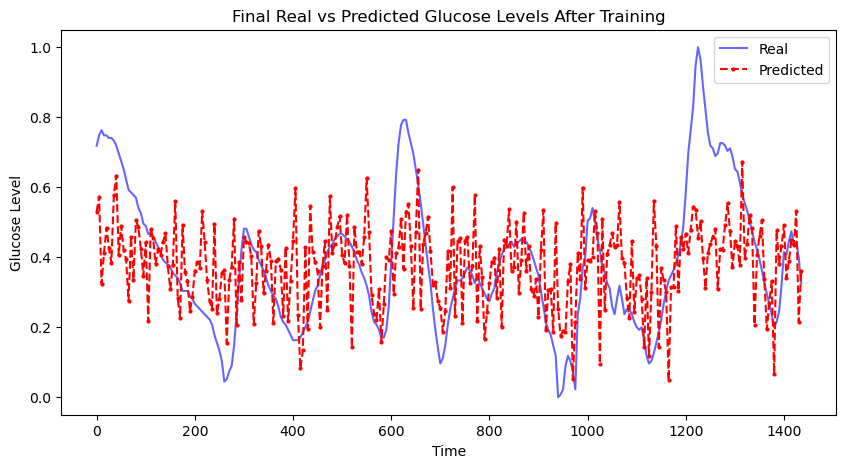

Epoch 7200, Loss: 0.0195565614849329


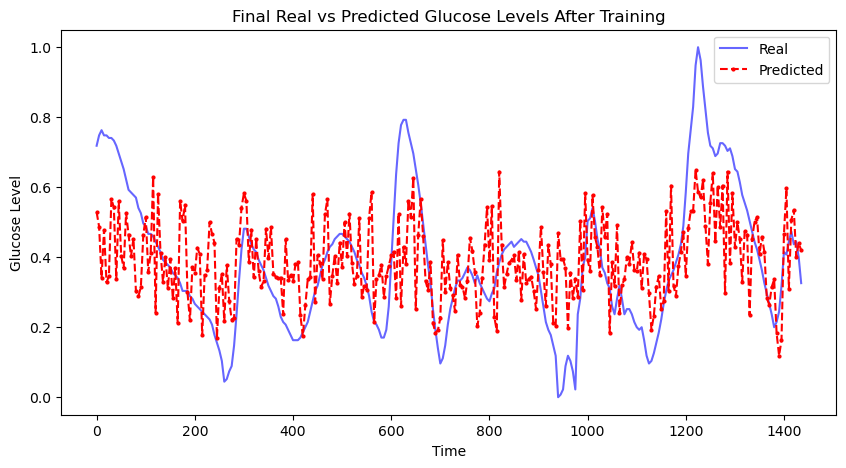

Epoch 7300, Loss: 0.025419820100069046


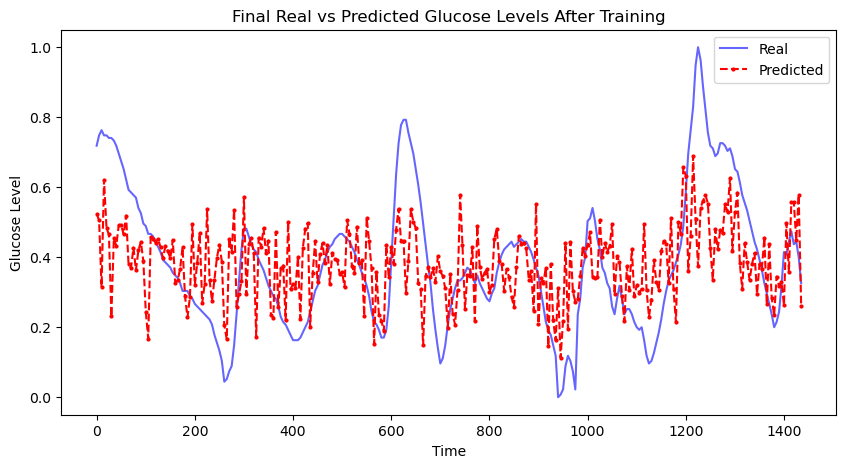

Epoch 7400, Loss: 0.021056363359093666


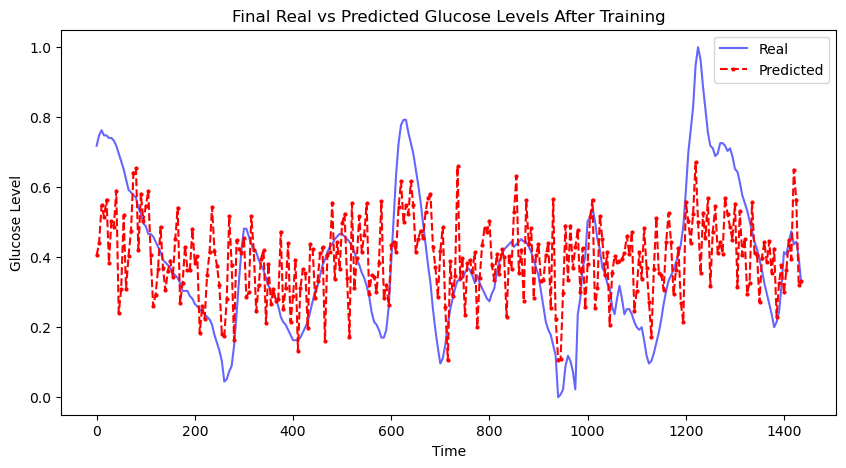

Epoch 7500, Loss: 0.024572446942329407


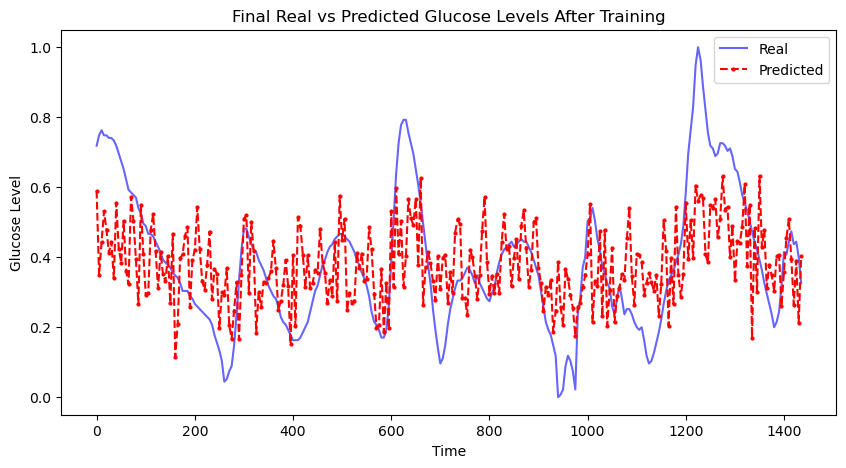

Epoch 7600, Loss: 0.02147149294614792


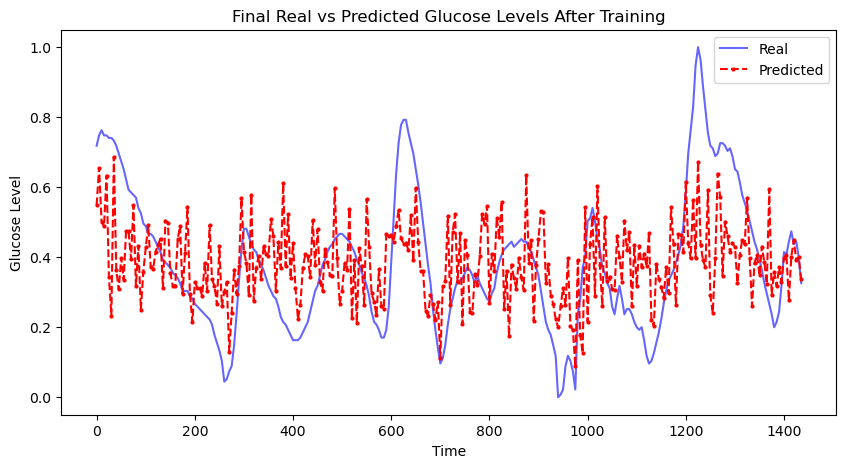

Epoch 7700, Loss: 0.021133799105882645


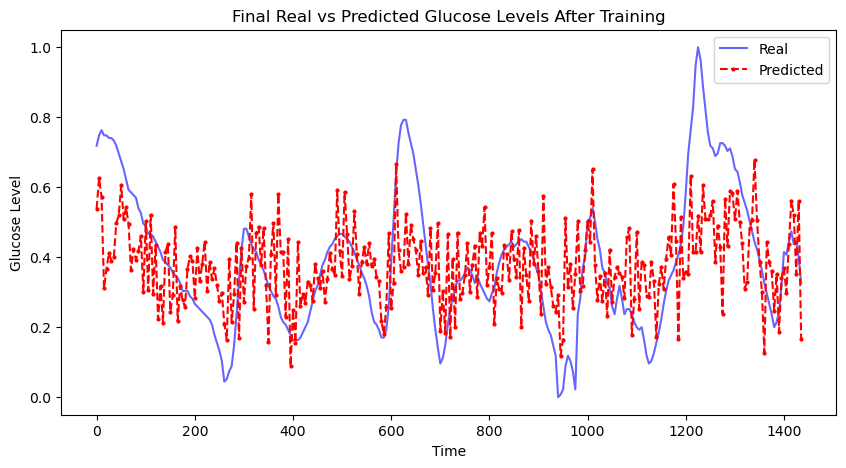

Epoch 7800, Loss: 0.021555885672569275


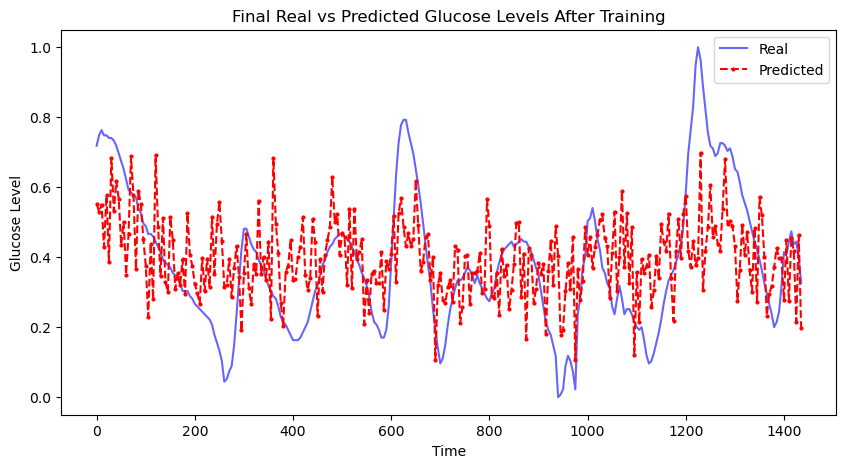

Epoch 7900, Loss: 0.021785395219922066


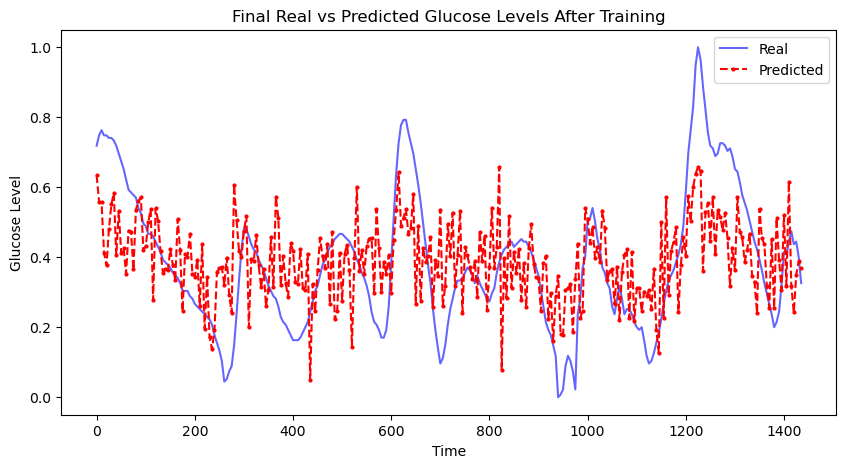

Epoch 8000, Loss: 0.021420415490865707


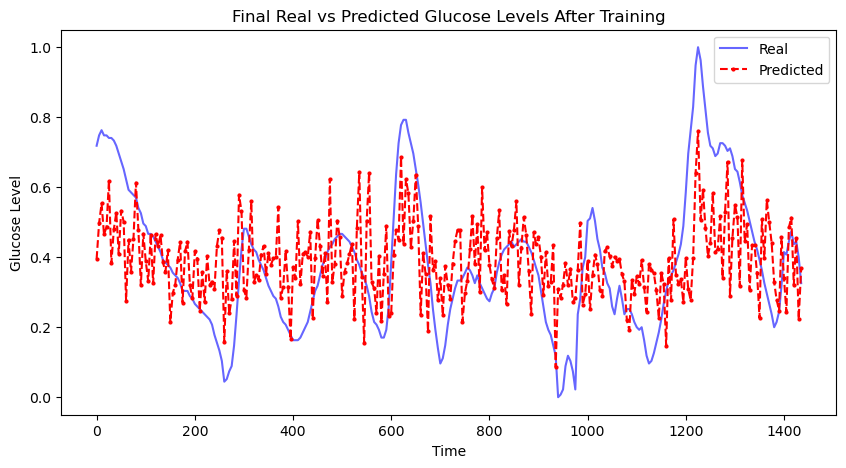

Epoch 8100, Loss: 0.01881842501461506


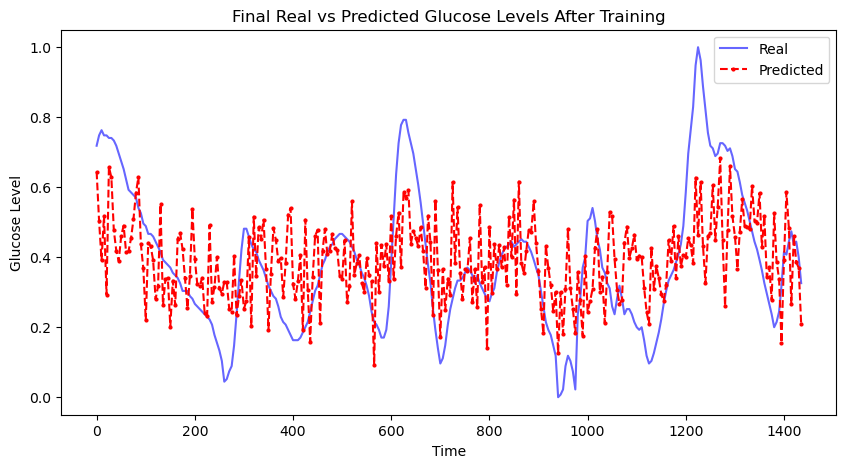

Epoch 8200, Loss: 0.018884893506765366


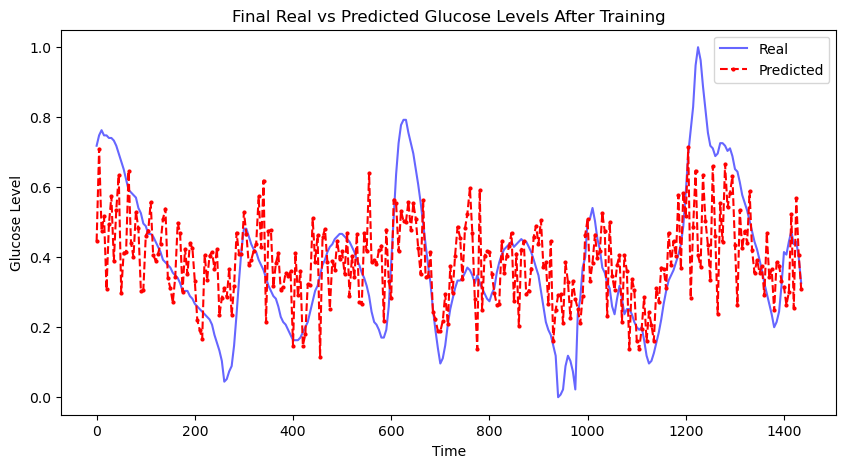

Epoch 8300, Loss: 0.022610295563936234


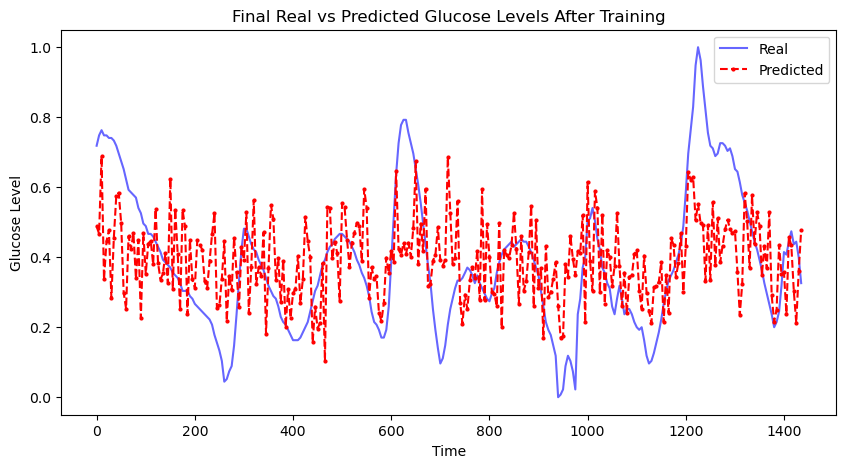

Epoch 8400, Loss: 0.02828766591846943


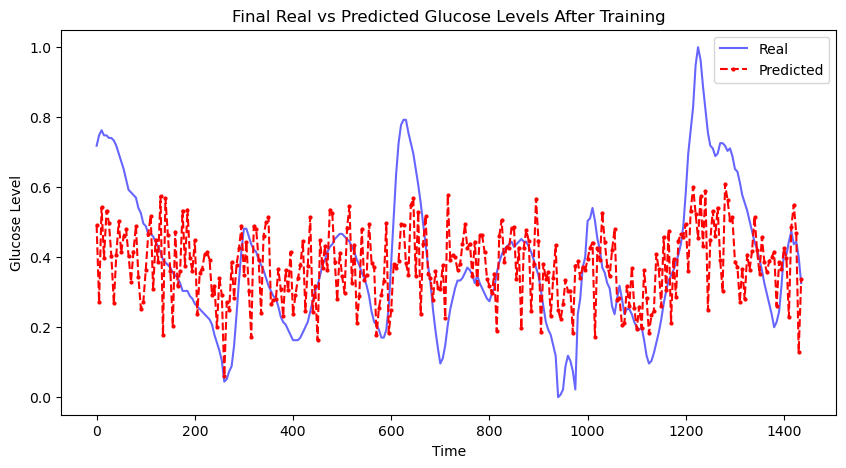

Epoch 8500, Loss: 0.01917330175638199


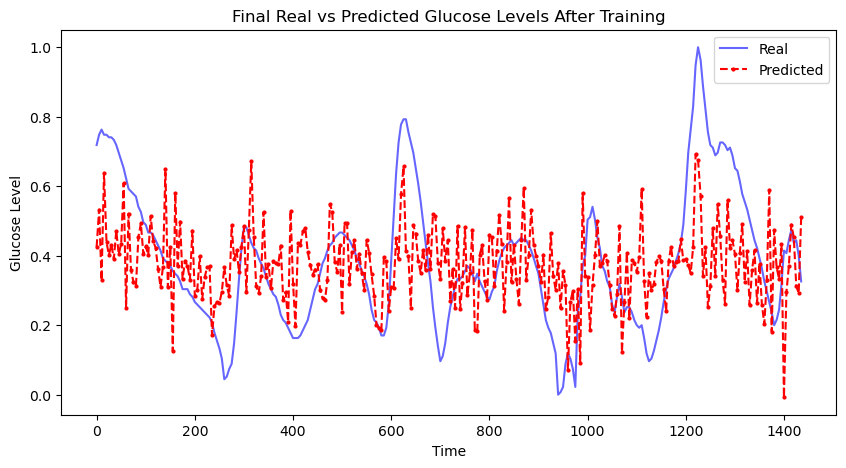

Epoch 8600, Loss: 0.020984012633562088


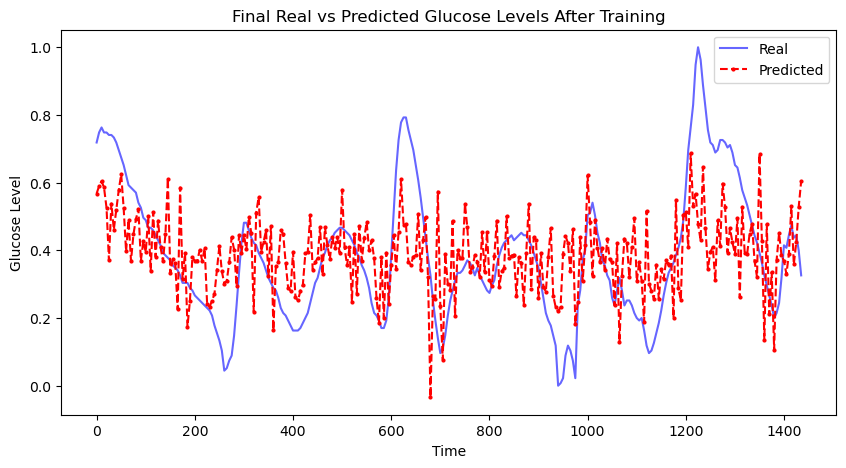

Epoch 8700, Loss: 0.019217796623706818


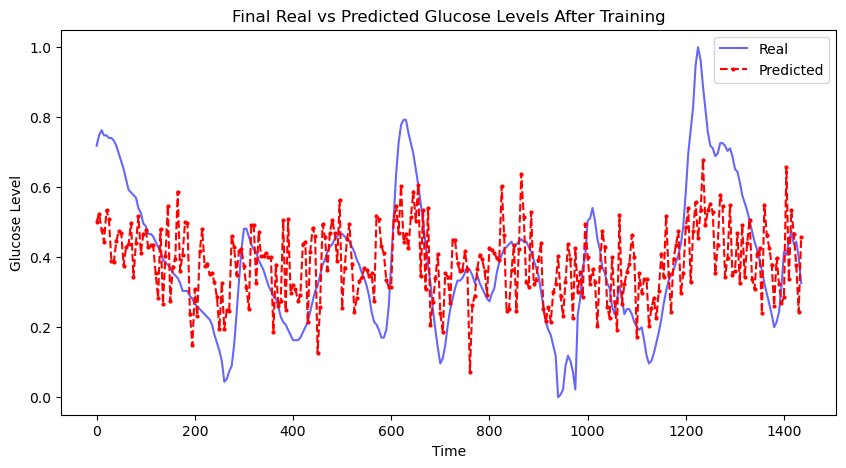

Epoch 8800, Loss: 0.024858437478542328


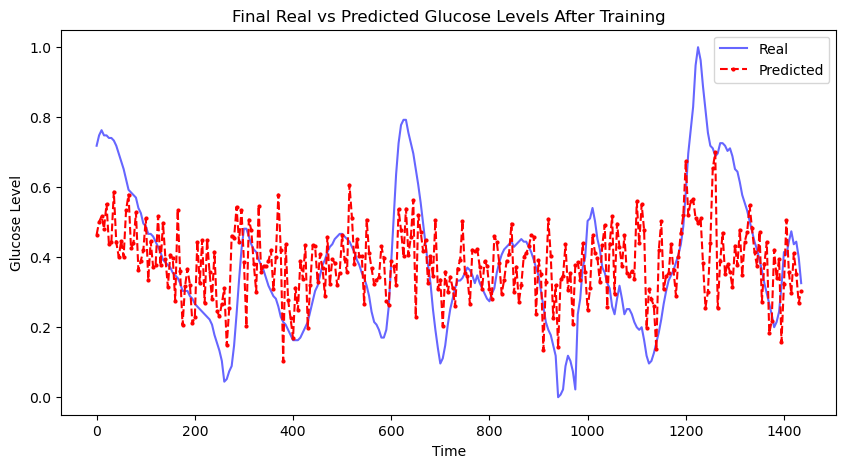

Epoch 8900, Loss: 0.019476762041449547


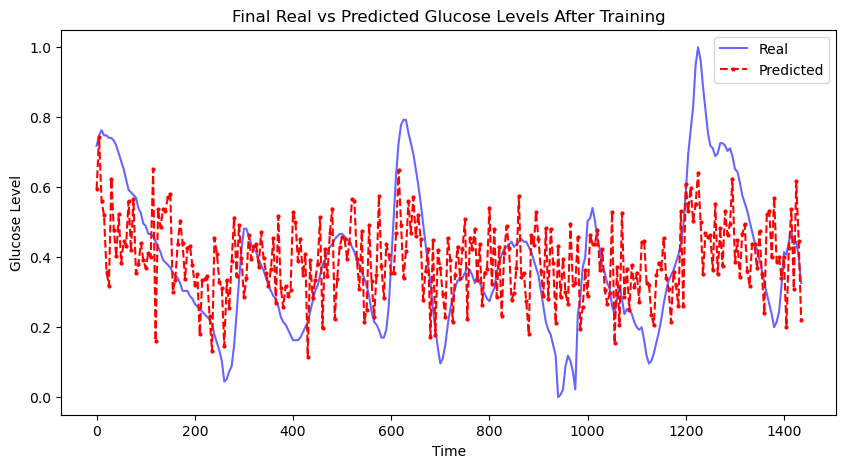

Epoch 9000, Loss: 0.018814140930771828


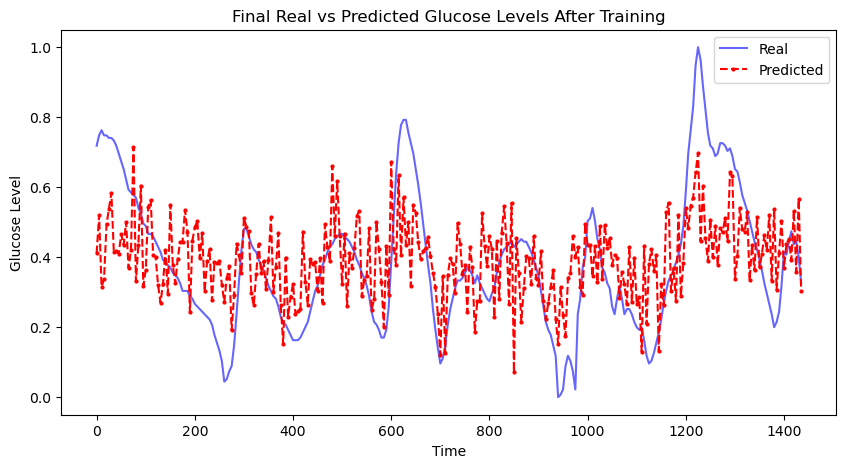

Epoch 9100, Loss: 0.01959143579006195


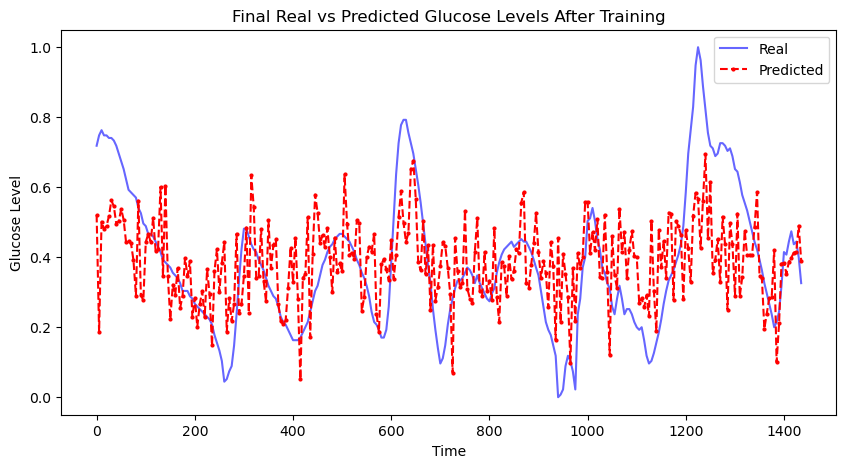

Epoch 9200, Loss: 0.020801790058612823


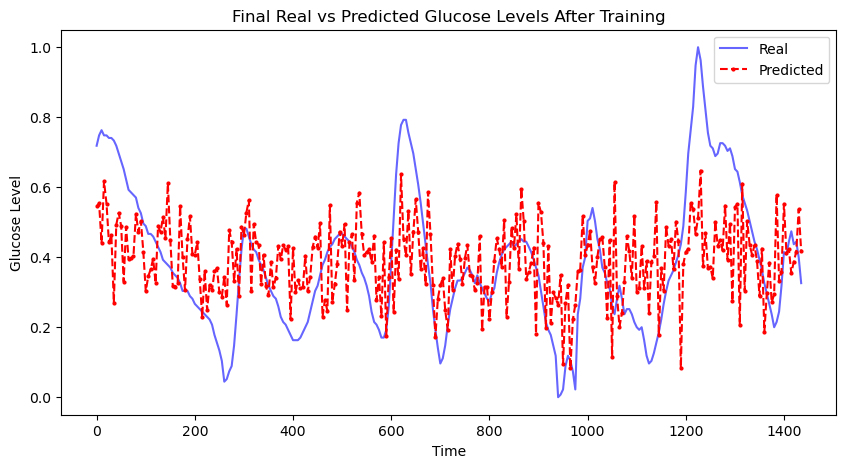

Epoch 9300, Loss: 0.022044889628887177


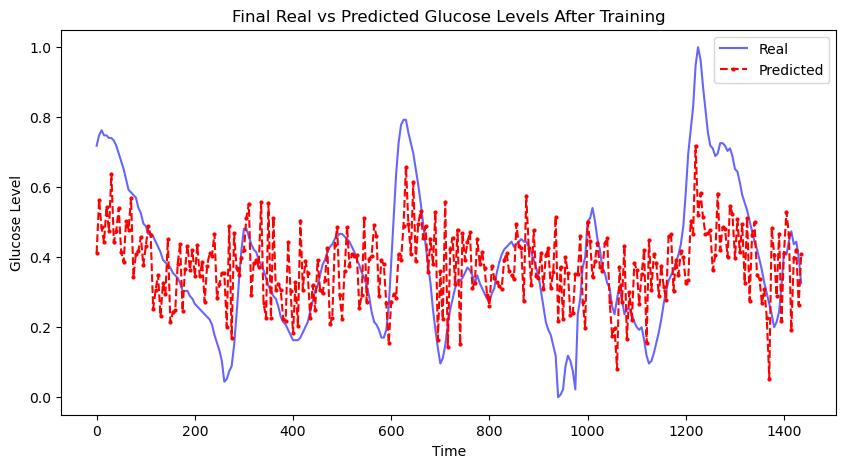

Epoch 9400, Loss: 0.02136368118226528


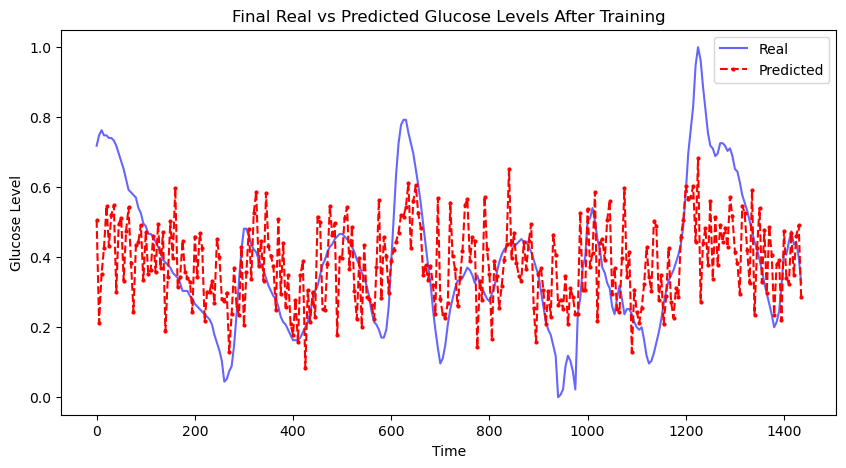

Epoch 9500, Loss: 0.021440444514155388


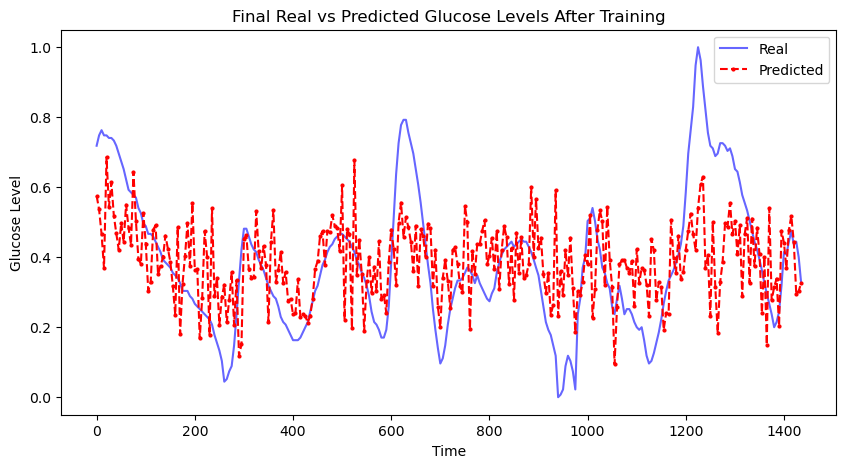

Epoch 9600, Loss: 0.021717868745326996


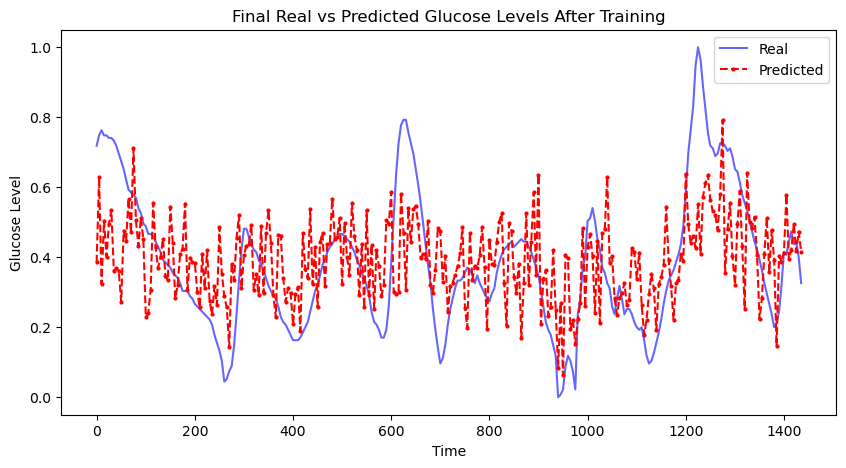

Epoch 9700, Loss: 0.021214257925748825


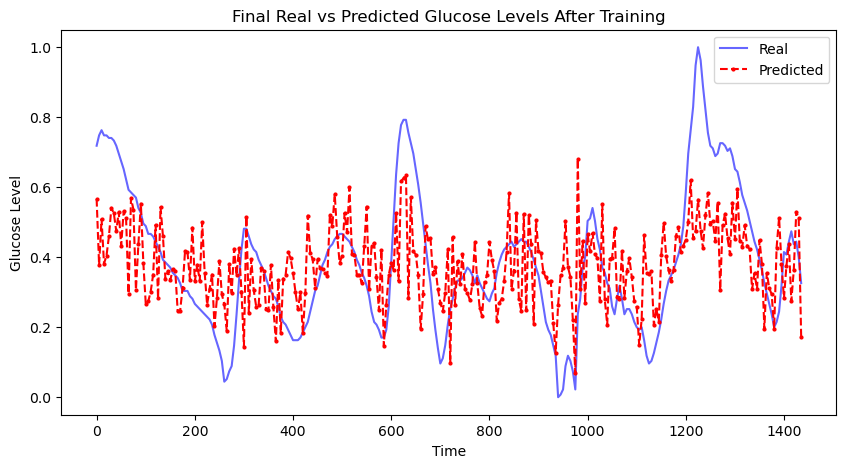

Epoch 9800, Loss: 0.01981726475059986


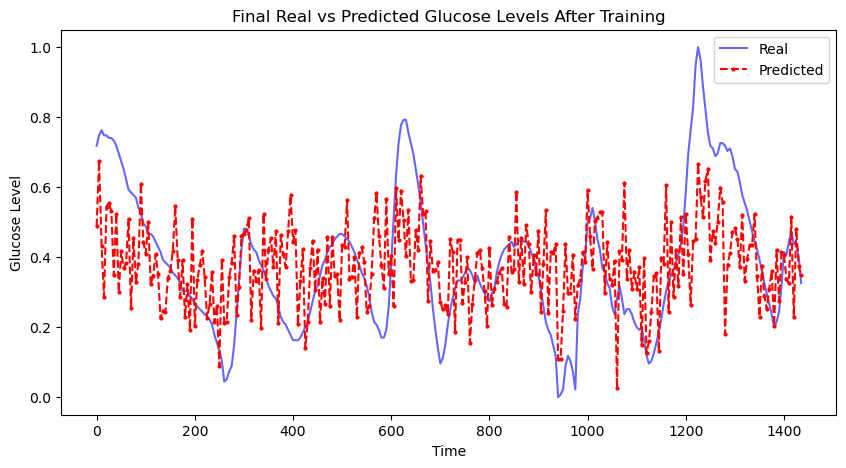

Epoch 9900, Loss: 0.021493081003427505


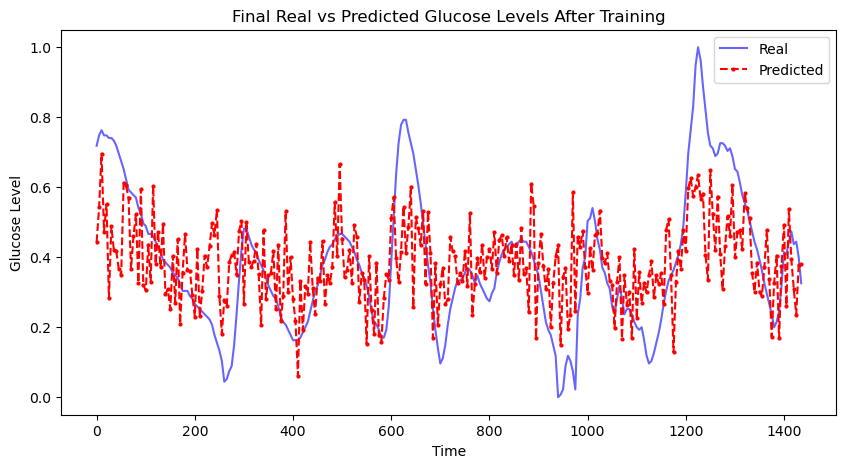

In [77]:
# Define training parameters
num_epochs = 10000
batch_size=30

# Prepare data with two features: CGMValue and HighLowIndicator
cgm_tensor = torch.tensor(df['CGMValue'].values, dtype=torch.float32).reshape(-1, 1)
high_low_tensor = torch.tensor(df['HighLowIndicator'].values, dtype=torch.float32).reshape(-1, 1)

# Concatenate both features to create a 2-dimensional input for x
cgm_tensor = torch.cat((cgm_tensor, high_low_tensor), dim=1)  # Shape: [num_data_points, 2]
time_tensor = torch.tensor(df['Time'].values, dtype=torch.float32).reshape(-1, 1)

# Training loop
for epoch in range(num_epochs):
    train_iter = gen_batch(cgm_tensor, time_tensor, batch_size)
    for x, t in train_iter:
        optim.zero_grad()

        # Forward pass through the VAE
        x_recon, z, z_mean, z_log_var = vae(x, t)

        # Reconstruction loss
        recon_loss = nn.MSELoss()(x_recon, x)

        # KL divergence loss
        kl_loss = -0.5 * torch.sum(1 + z_log_var - z_mean.pow(2) - z_log_var.exp())

        # Total loss
        loss = recon_loss + 0.01 * kl_loss / x.size(0)
        loss.backward()
        optim.step()

    if epoch%100==0:
        print(f'Epoch {epoch}, Loss: {loss.item()}')

        # Clear the final lists for real and predicted values to avoid duplication
        all_real_values = []
        all_pred_values = []
        all_time_values = []

        # After training, evaluate the model on the entire dataset sequentially
        with torch.no_grad():
            # Generate predictions for the entire dataset without batching
            x_recon, _, _, _ = vae(cgm_tensor.unsqueeze(0), time_tensor.unsqueeze(0))  # Pass entire dataset as a single batch

            # Flatten the predictions and convert tensors to numpy arrays for plotting
            real_values = cgm_tensor[:, 0].cpu().numpy().flatten()  # Real glucose values
            pred_values = x_recon[0, :, 0].cpu().numpy().flatten()  # Predicted glucose values (flatten to 1D array)
            time_values = time_tensor[:, 0].cpu().numpy().flatten()  # Time values

            # Collect values for final plot
            all_real_values.extend(real_values)
            all_pred_values.extend(pred_values)
            all_time_values.extend(time_values)

        # Sort all values by time to ensure they are plotted in the correct order
        sorted_data = sorted(zip(all_time_values, all_real_values, all_pred_values), key=lambda x: x[0])
        sorted_time_values, sorted_real_values, sorted_pred_values = zip(*sorted_data)

        # Final plot after training
        plt.figure(figsize=(10, 5))
        plt.plot(sorted_time_values, sorted_real_values, label='Real', color='blue', alpha=0.6)
        plt.plot(sorted_time_values, sorted_pred_values, label='Predicted', color='red', linestyle='--', marker='o', markersize=2)

        # Labels and title
        plt.xlabel('Time')
        plt.ylabel('Glucose Level')
        plt.title("Final Real vs Predicted Glucose Levels After Training")
        plt.legend()
        plt.show()

In [59]:
cgm_tensor = torch.tensor(df['CGMValue'].values, dtype=torch.float32).reshape(-1, 1)
time_tensor = torch.tensor(df['Time'].values, dtype=torch.float32).reshape(-1, 1)

cgm_tensor = cgm_tensor.unsqueeze(0)  # Shape: [1, num_data_points, 1]
time_tensor = time_tensor.unsqueeze(0)  # Shape: [1, num_data_points, 1]

print("Shape of cgm_tensor:", cgm_tensor.shape)
print("Shape of time_tensor:", time_tensor.shape)

print("Data type of cgm_tensor:", cgm_tensor.dtype)
print("Data type of time_tensor:", time_tensor.dtype)

df['CGMValue'] = pd.to_numeric(df['CGMValue'], errors='coerce')
df['Time'] = pd.to_numeric(df['Time'], errors='coerce')

# Training loop for the entire dataset without mini-batches
for epoch in range(num_epochs):
    # Zero the gradients
    optim.zero_grad()

    # Forward pass through the VAE with the entire dataset
    x_recon, z, z_mean, z_log_var = vae(cgm_tensor, time_tensor)

    # Reconstruction loss
    recon_loss = nn.MSELoss()(x_recon, cgm_tensor)

    # KL divergence loss
    kl_loss = -0.5 * torch.sum(1 + z_log_var - z_mean.pow(2) - z_log_var.exp())

    # Total loss
    loss = recon_loss + kl_loss / cgm_tensor.size(0)
    loss.backward()
    optim.step()

    # Print the loss at regular intervals
    if epoch % 100 == 0:
        print(f'Epoch {epoch}, Loss: {loss.item()}')

        # Plot the real and predicted values for the entire dataset
        plt.figure(figsize=(10, 5))

        # Convert to numpy for plotting
        real_values = cgm_tensor[:, 0].detach().cpu().numpy().flatten()  # Real glucose values
        pred_values = x_recon[:, 0].detach().cpu().numpy().flatten()  # Predicted glucose values
        time_values = time_tensor[:, 0].detach().cpu().numpy().flatten()  # Time values

        # Plot real vs. predicted values
        plt.plot(time_values, real_values, label='Real', color='blue', alpha=0.6)
        plt.plot(time_values, pred_values, label='Predicted', color='red', linestyle='--')

        # Labels and title
        plt.xlabel('Time')
        plt.ylabel('Glucose Level')
        plt.title(f"Real vs Predicted Glucose Levels (Epoch {epoch})")
        plt.legend()
        plt.show()

print("Training completed.")


Shape of cgm_tensor: torch.Size([1, 288, 1])
Shape of time_tensor: torch.Size([1, 288, 1])
Data type of cgm_tensor: torch.float32
Data type of time_tensor: torch.float32


UnboundLocalError: local variable 'f_i' referenced before assignment

## Step 4: Testing and Evaluation

In [ ]:
# Using the trained model to predict future glucose levels
with torch.no_grad():
    future_times = torch.tensor(np.linspace(df['Time'].max(), df['Time'].max() + 60, 60), dtype=torch.float32).reshape(-1, 1)
    future_predictions = odeint(ode_func, cgm_tensor[-1:], future_times)

# Convert predictions back to original glucose scale
future_predictions = future_predictions.detach().numpy() * (df['CGMValue'].max() - df['CGMValue'].min()) + df['CGMValue'].min()

import matplotlib.pyplot as plt
plt.plot(df['DataDtTm'], df['CGMValue'] * (df['CGMValue'].max() - df['CGMValue'].min()) + df['CGMValue'].min(), label='Actual')
plt.plot(pd.date_range(df['DataDtTm'].iloc[-1], periods=60, freq='5min'), future_predictions, label='Predicted')
plt.xlabel('Time')
plt.ylabel('Glucose Level')
plt.legend()
plt.show()